# Advanced Linear Regression
## Machine Learning Predictive model for Surprise Housing company
### Problem Statement:
Surprise Housing is an US-based housing company, which has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price.The company is looking at prospective properties to buy to enter the market and is looking for a predictive model which can predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:

* Which variables are significant in predicting the price of a house, and

* How well those variables describe the price of a house.


### Business Goal  

Model the price of houses with the available independent variables, which will then be used by the management to understand how exactly the prices vary with the variables. Management can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

## Steps followed to build the model
1. Data understanding and exploration
2. Data visualization
3. Data preparation
4. Model building and evaluation

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import statsmodels
import scipy
import statsmodels.api as sm
import itertools
from scipy import stats
from scipy.stats import boxcox 
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,r2_score,mean_squared_error
from sklearn.linear_model import Ridge, Lasso, LinearRegression
import warnings
import IPython
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
pd.set_option('display.max_colwidth', None)
warnings.filterwarnings('ignore')

print('library - ',np.__name__,' version ',np.__version__)
print('library - ', pd.__name__,' version ' ,pd.__version__)
print('library - ',matplotlib.__name__,' version ',matplotlib.__version__)
print('library - ',sns.__name__,' version ',sns.__version__)
print('library - ', sklearn.__name__,' version ' ,sklearn.__version__)
print('library - ',statsmodels.__name__,' version ',statsmodels.__version__)
print('library - ', scipy.__name__,' version ' ,scipy.__version__)
print('library - ',IPython.__name__,' version ',IPython.__version__)
print('library - ',warnings.__name__)
print('library - ',itertools.__name__)

library -  numpy  version  1.21.5
library -  pandas  version  1.4.3
library -  matplotlib  version  3.5.2
library -  seaborn  version  0.11.2
library -  sklearn  version  1.1.1
library -  statsmodels  version  0.13.2
library -  scipy  version  1.7.3
library -  IPython  version  8.4.0
library -  warnings
library -  itertools


## 1. Data understanding, treating missing value and exploration
### 1.1 Data understanding, treating missing value 

In [2]:
# Read the data, check shape, data types and see how the data is looking
pd.options.display.max_columns = None
pd.options.display.max_rows = None
house_sales = pd.read_csv('train.csv')
house_sales.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
# check shape and info of the dataset
print(house_sales.shape,'\n')
print(house_sales.dtypes.unique(),'\n')
house_sales.info()

(1460, 81) 

[dtype('int64') dtype('O') dtype('float64')] 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   objec

In [4]:
house_sales.describe(percentiles=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.997]).round(2)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.00,1460.0,1201.00,1460.00,1460.00,1460.00,1460.00,1460.00,1452.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1379.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.0
mean,730.50,56.9,70.05,10516.83,6.10,5.58,1971.27,1984.87,103.69,443.64,46.55,567.24,1057.43,1162.63,346.99,5.84,1515.46,0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,1978.51,1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,2007.82,180921.2
std,421.61,42.3,24.28,9981.26,1.38,1.11,30.20,20.65,181.07,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,24.69,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,1.33,79442.5
min,1.00,20.0,21.00,1300.00,1.00,1.00,1872.00,1950.00,0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,1900.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2006.00,34900.0
10%,146.90,20.0,44.00,5000.00,5.00,5.00,1924.90,1950.00,0.00,0.00,0.00,74.90,636.90,756.90,0.00,0.00,912.00,0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1945.00,1.00,240.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,2006.00,106475.0
20%,292.80,20.0,53.00,7078.40,5.00,5.00,1947.80,1961.80,0.00,0.00,0.00,172.00,755.80,848.00,0.00,0.00,1066.60,0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1957.00,1.00,295.60,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,2006.00,124000.0
30%,438.70,20.0,60.00,8063.70,5.00,5.00,1958.00,1971.00,0.00,0.00,0.00,280.00,840.00,915.70,0.00,0.00,1208.00,0.00,0.00,1.00,0.00,3.00,1.00,6.00,0.00,1965.00,1.00,384.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2007.00,135500.0
40%,584.60,30.0,63.00,8793.40,6.00,5.00,1965.00,1980.00,0.00,218.60,0.00,374.60,910.00,1000.20,0.00,0.00,1339.00,0.00,0.00,1.00,0.00,3.00,1.00,6.00,0.00,1973.00,2.00,440.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.00,2007.00,147000.0
50%,730.50,50.0,69.00,9478.50,6.00,5.00,1973.00,1994.00,0.00,383.50,0.00,477.50,991.50,1087.00,0.00,0.00,1464.00,0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,1980.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,2008.00,163000.0
60%,876.40,60.0,74.00,10198.20,6.00,5.00,1984.00,1998.00,16.00,525.60,0.00,604.40,1088.00,1182.00,455.40,0.00,1578.00,1.00,0.00,2.00,0.00,3.00,1.00,7.00,1.00,1993.00,2.00,516.00,100.00,40.00,0.00,0.00,0.00,0.00,0.00,7.00,2008.00,179280.0


In [5]:
# Drop Id column for obvious reason that it is just a row number in the data
house_sales.drop(columns='Id',inplace = True)

### From the data dictionary we can notice that the data has Numerical, Nominal Categorical and Ordinal Categorical features. 

#### Some of the categorical features have numeric values. Let's identify those and make sure that they represent right data


In [6]:
house_sales.select_dtypes(exclude='object').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 37 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   LotFrontage    1201 non-null   float64
 2   LotArea        1460 non-null   int64  
 3   OverallQual    1460 non-null   int64  
 4   OverallCond    1460 non-null   int64  
 5   YearBuilt      1460 non-null   int64  
 6   YearRemodAdd   1460 non-null   int64  
 7   MasVnrArea     1452 non-null   float64
 8   BsmtFinSF1     1460 non-null   int64  
 9   BsmtFinSF2     1460 non-null   int64  
 10  BsmtUnfSF      1460 non-null   int64  
 11  TotalBsmtSF    1460 non-null   int64  
 12  1stFlrSF       1460 non-null   int64  
 13  2ndFlrSF       1460 non-null   int64  
 14  LowQualFinSF   1460 non-null   int64  
 15  GrLivArea      1460 non-null   int64  
 16  BsmtFullBath   1460 non-null   int64  
 17  BsmtHalfBath   1460 non-null   int64  
 18  FullBath

#### From the above info, we can notice that three categorical features MSSubClass, OverallQual and OverallCond are having numeric value. 

MSSubClass is a Nominal Categorical feature, OverallQual and OverallCond are Ordinal Categorical features. Change MSSubClass, OverallQual and OverallCond category type.

In [7]:
# Change MSSubClass to categorical
house_sales[['MSSubClass','OverallQual','OverallCond']] = house_sales[['MSSubClass','OverallQual','OverallCond']].astype('category')

# Check all categorical features 
house_sales.select_dtypes(include=['object','category']).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 46 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   category
 1   MSZoning       1460 non-null   object  
 2   Street         1460 non-null   object  
 3   Alley          91 non-null     object  
 4   LotShape       1460 non-null   object  
 5   LandContour    1460 non-null   object  
 6   Utilities      1460 non-null   object  
 7   LotConfig      1460 non-null   object  
 8   LandSlope      1460 non-null   object  
 9   Neighborhood   1460 non-null   object  
 10  Condition1     1460 non-null   object  
 11  Condition2     1460 non-null   object  
 12  BldgType       1460 non-null   object  
 13  HouseStyle     1460 non-null   object  
 14  OverallQual    1460 non-null   category
 15  OverallCond    1460 non-null   category
 16  RoofStyle      1460 non-null   object  
 17  RoofMatl       1460 non-null   ob

#### Checked in dictionary and identfied/verified that all the features with object data type from above info are categorical. Update the data type as category for all object type features

In [8]:
# Change data type of categorical features from object data type to category
objectDataTypeFeatures = house_sales.select_dtypes(include=['object']).columns
house_sales[objectDataTypeFeatures] = house_sales[objectDataTypeFeatures].astype('category')

house_sales.select_dtypes(include=['object','category']).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 46 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1460 non-null   category
 1   MSZoning       1460 non-null   category
 2   Street         1460 non-null   category
 3   Alley          91 non-null     category
 4   LotShape       1460 non-null   category
 5   LandContour    1460 non-null   category
 6   Utilities      1460 non-null   category
 7   LotConfig      1460 non-null   category
 8   LandSlope      1460 non-null   category
 9   Neighborhood   1460 non-null   category
 10  Condition1     1460 non-null   category
 11  Condition2     1460 non-null   category
 12  BldgType       1460 non-null   category
 13  HouseStyle     1460 non-null   category
 14  OverallQual    1460 non-null   category
 15  OverallCond    1460 non-null   category
 16  RoofStyle      1460 non-null   category
 17  RoofMatl       1460 non-null   ca

In [9]:
#Let's check missing values in Numerical/Ordinal features
def print_feature_name_of_missing_values(*, pDataFrame, pExcludeCategory):
    flag = False
    for feature in house_sales.select_dtypes(exclude = pExcludeCategory).columns:
        if house_sales[feature].isna().any():
            print(feature)
            flag = True
    if flag == False :
        print(" There is no feature with a missing value ")

# print feature names of with missing value
print_feature_name_of_missing_values(pDataFrame = house_sales, pExcludeCategory = 'category')

LotFrontage
MasVnrArea
GarageYrBlt


In [10]:
# Find % of missing values in'LotFrontage','MasVnrArea','GarageYrBlt' as we can see from above result that they have missing values.
(house_sales[['LotFrontage','MasVnrArea','GarageYrBlt']].isna().mean()* 100).round(2)

LotFrontage    17.74
MasVnrArea      0.55
GarageYrBlt     5.55
dtype: float64

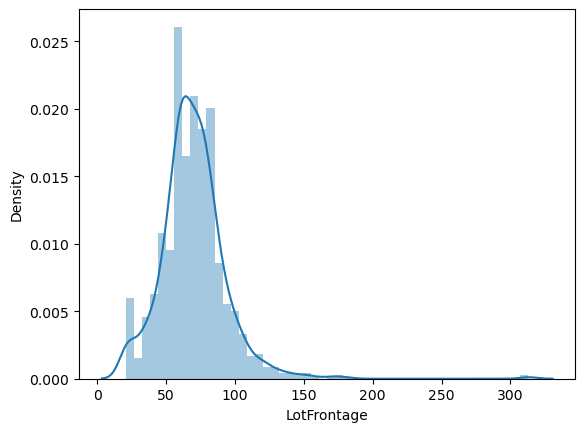

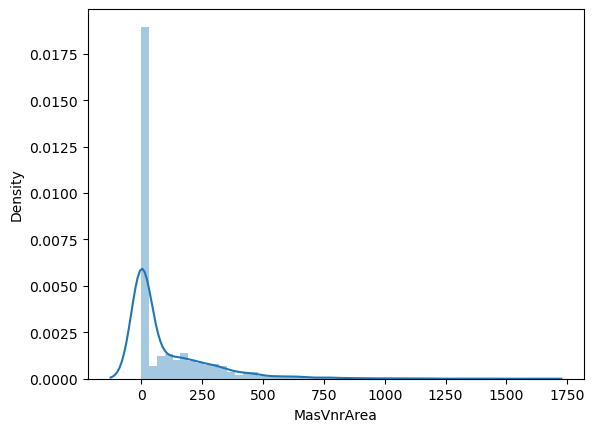

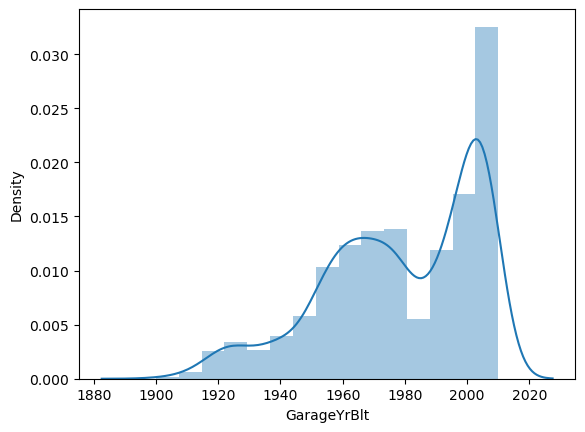

In [11]:
# Let's check the distribution of 'LotFrontage','MasVnrArea','GarageYrBlt'
for col in ['LotFrontage','MasVnrArea','GarageYrBlt']:
    sns.distplot(house_sales[col])
    plt.show()

In [12]:
# Check the value counts of MSZoning where LotFrontage value is missing
print(house_sales[house_sales.LotFrontage.isna()].shape, '\n')
print(house_sales[house_sales.LotFrontage.isna()].MSZoning.value_counts(), '\n')
print(house_sales[house_sales.LotFrontage.isna()].MSZoning.value_counts() / house_sales[house_sales.LotFrontage.isna()].shape[0] * 100)


(259, 80) 

RL         229
RM          19
FV           8
RH           3
C (all)      0
Name: MSZoning, dtype: int64 

RL         88.416988
RM          7.335907
FV          3.088803
RH          1.158301
C (all)     0.000000
Name: MSZoning, dtype: float64


In [13]:
# LotFrontage value is missing in almost all the cases for houses whose MSZoning RL	Residential Low Density
# Lest check the stats of LotFrontage for houses whose MSZoning RL	Residential Low Density
lotFrontageForModeOfMSZoning = house_sales[house_sales.MSZoning == house_sales[house_sales.LotFrontage.isna()].MSZoning.mode()[0]].LotFrontage
print('Mode of LotFrontage for mode of MSZoning :', lotFrontageForModeOfMSZoning.mode()[0])
print('Mean of LotFrontage for mode of MSZoning :', lotFrontageForModeOfMSZoning.mean())
print('Median of LotFrontage for mode of MSZoning :', lotFrontageForModeOfMSZoning.median())

Mode of LotFrontage for mode of MSZoning : 60.0
Mean of LotFrontage for mode of MSZoning : 74.68004338394793
Median of LotFrontage for mode of MSZoning : 72.0


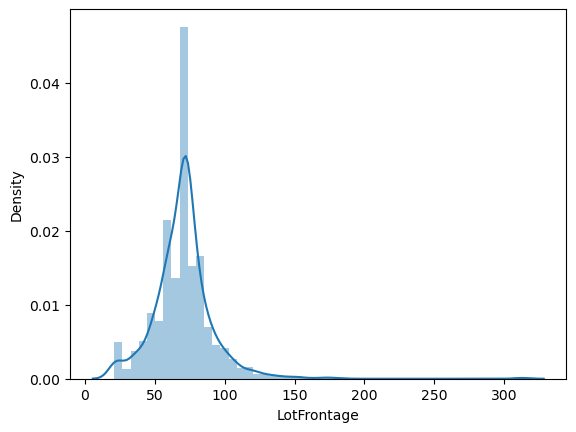

In [14]:
# From what we noticed about 229 out of 259, which is 88% missing values in LotFrontage are for MSZoning RL	Residential Low Density
# Let's impute missing values in LotFrontage with median() of LotFrontage where MSZoning is RL	Residential Low Density
house_sales.LotFrontage.fillna(lotFrontageForModeOfMSZoning.median(), inplace = True)
sns.distplot(house_sales.LotFrontage)
plt.show()

In [15]:
# Lets check the records with Masonry veneer area details, where MasVnrArea is missing 
house_sales[house_sales.MasVnrArea.isna()]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
234,60,RL,72.0,7851,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,625,Unf,0,235,860,GasA,Ex,Y,SBrkr,860,1100,0,1960,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002.0,Fin,2,440,TA,TA,Y,288,48,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,216500
529,20,RL,72.0,32668,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NaN,NaN,Gd,TA,PConc,TA,TA,No,Rec,1219,Unf,0,816,2035,GasA,TA,Y,SBrkr,2515,0,0,2515,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975.0,RFn,2,484,TA,TA,Y,0,0,200,0,0,0,NaN,NaN,NaN,0,3,2007,WD,Alloca,200624
650,60,FV,65.0,8125,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,6,2007,2007,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,813,813,GasA,Ex,Y,SBrkr,822,843,0,1665,0,0,2,1,3,1,Gd,7,Typ,0,NaN,Attchd,2007.0,RFn,2,562,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,205950
936,20,RL,67.0,10083,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,833,Unf,0,343,1176,GasA,Ex,Y,SBrkr,1200,0,0,1200,1,0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,2003.0,RFn,2,555,TA,TA,Y,0,41,0,0,0,0,NaN,NaN,NaN,0,8,2009,WD,Normal,184900
973,20,FV,95.0,11639,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1428,1428,GasA,Ex,Y,SBrkr,1428,0,0,1428,0,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,2007.0,Fin,2,480,TA,TA,Y,0,120,0,0,0,0,NaN,NaN,NaN,0,12,2008,New,Partial,182000
977,120,FV,35.0,4274,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,TwnhsE,1Story,7,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,1106,Unf,0,135,1241,GasA,Ex,Y,SBrkr,1241,0,0,1241,1,0,1,1,1,1,Gd,4,Typ,0,NaN,Attchd,2007.0,Fin,2,569,TA,TA,Y,0,116,0,0,0,0,NaN,NaN,NaN,0,11,2007,New,Partial,199900
1243,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Ex,TA,PConc,Ex,Gd,Gd,GLQ,1386,Unf,0,690,2076,GasA,Ex,Y,SBrkr,2076,0,0,2076,1,0,2,1,2,1,Ex,7,Typ,1,Gd,Attchd,2006.0,Fin,3,850,TA,TA,Y,216,229,0,0,0,0,NaN,NaN,NaN,0,9,2006,New,Partial,465000
1278,60,RL,75.0,9473,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,804,Unf,0,324,1128,GasA,Ex,Y,SBrkr,1128,903,0,2031,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002.0,RFn,2,577,TA,TA,Y,0,211,0,0,0,0,NaN,NaN,NaN,0,3,2008,WD,Normal,237000


In [16]:
## Let's remove 8 records with missing MasVnrArea 
house_sales = house_sales[~house_sales.MasVnrArea.isna()]

In [17]:

# Lets check the records with Garage details, where GarageYrBlt is missing 
house_sales[house_sales.GarageYrBlt.isna()][['GarageType','GarageYrBlt','GarageFinish','GarageCars','GarageArea','GarageQual','GarageCond']]


,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
39,NaN,NaN,NaN,0,0,NaN,NaN
48,NaN,NaN,NaN,0,0,NaN,NaN
78,NaN,NaN,NaN,0,0,NaN,NaN
88,NaN,NaN,NaN,0,0,NaN,NaN
89,NaN,NaN,NaN,0,0,NaN,NaN
99,NaN,NaN,NaN,0,0,NaN,NaN
108,NaN,NaN,NaN,0,0,NaN,NaN
125,NaN,NaN,NaN,0,0,NaN,NaN
127,NaN,NaN,NaN,0,0,NaN,NaN
140,NaN,NaN,NaN,0,0,NaN,NaN


### From the above garage info, we can clearly see that the houses where GarageYrBlt is missing do not have a garage.


In [18]:
# Let's check couple of things in the data
# Check % of houses whose Garage is built while remodelling and Garage is built while building the house
print("Records where YearBuilt is greater than YearSold :", len(house_sales[house_sales.YearBuilt > house_sales.YrSold]))
# check if there is any records whose house sqft measurments is greater than LotArea
area_features = ['MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','GarageArea','PoolArea']
for feature in area_features :
    print(f'Records where {feature} is greater than LotArea :', len(house_sales[house_sales[feature] > house_sales.LotArea]))
    
print('\n')    
print(f'{round(len(house_sales[house_sales.YearRemodAdd==house_sales.GarageYrBlt])/ len(house_sales) * 100)} % of houses"s garage is built while when they remodelled')
print(f'{round(len(house_sales[house_sales.YearBuilt==house_sales.GarageYrBlt])/ len(house_sales) * 100)} % of houses"s garage is built while when they constructed')
print(f'{round(len(house_sales[house_sales.YearBuilt==house_sales.YearRemodAdd])/ len(house_sales) * 100)} % of houses"s are built and remodelled in the same year')
print(f'{round(len(house_sales[(house_sales.YearBuilt != house_sales.GarageYrBlt) &  (house_sales.YearRemodAdd != house_sales.GarageYrBlt)])/ len(house_sales) * 100)} % of houses"s garage is built on a differt year than year of house built or remodelled')

Records where YearBuilt is greater than YearSold : 0
Records where MasVnrArea is greater than LotArea : 0
Records where BsmtFinSF1 is greater than LotArea : 0
Records where BsmtFinSF2 is greater than LotArea : 0
Records where BsmtUnfSF is greater than LotArea : 0
Records where TotalBsmtSF is greater than LotArea : 0
Records where 1stFlrSF is greater than LotArea : 0
Records where 2ndFlrSF is greater than LotArea : 0
Records where LowQualFinSF is greater than LotArea : 0
Records where GrLivArea is greater than LotArea : 0
Records where GarageArea is greater than LotArea : 0
Records where PoolArea is greater than LotArea : 0


49 % of houses"s garage is built while when they remodelled
75 % of houses"s garage is built while when they constructed
52 % of houses"s are built and remodelled in the same year
22 % of houses"s garage is built on a differt year than year of house built or remodelled


In [19]:
house_sales[['GarageYrBlt','YearBuilt']].corr()

,GarageYrBlt,YearBuilt
GarageYrBlt,1.000000,0.824669
YearBuilt,0.824669,1.000000


In [20]:
# Drop GarageYrBlt as it multicollinear with YearBuilt and along with that 5.55% houses in the data set do not have Garage
house_sales.drop(columns='GarageYrBlt', inplace=True)

In [21]:

# Lets check again if we have any missing values in numerical/ordinal feature
print_feature_name_of_missing_values(pDataFrame = house_sales, pExcludeCategory= 'category')

 There is no feature with a missing value 


#### Now, we can see none of the Numerical and Ordinal features have missing value.
#### Let's check the nominal categorical features for any missing values

In [22]:
featureWithNAValuesIdentifiedAsNaNs = list()

for col in house_sales.select_dtypes(include=['category']).columns :
    if house_sales[col].isna().any() :
        print(col)
        featureWithNAValuesIdentifiedAsNaNs.append(col)

Alley
BsmtQual
BsmtCond
BsmtExposure
BsmtFinType1
BsmtFinType2
Electrical
FireplaceQu
GarageType
GarageFinish
GarageQual
GarageCond
PoolQC
Fence
MiscFeature


#### Below features seem to have NA value. Let's verify by looking at dictionary
1. Alley
2. BsmtQual
3. BsmtCond
4. BsmtExposure
5. BsmtFinType1
6. BsmtFinType2
7. Electrical
8. FireplaceQu
9. GarageType
10. GarageFinish
11. GarageQual
12. GarageCond
13. PoolQC
14. Fence
15. MiscFeature

#### By default Pandas will treat NA string as NaNs. After checking the dictionary, we can easily say NA is referring to Not Applicable or the respective feature doesn't exist.

For all the 15 features except for Electrical NA reprsents that the feature is not available.

Let's impute "N A" for all NaNs of 15 features above except for Electrical 

In [23]:
# check the data where the value for Electrical is missing
house_sales[house_sales.Electrical.isna()]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1379,80,RL,73.0,9735,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,167500


In [24]:
# Remove one record with Electrical
house_sales = house_sales[~house_sales.Electrical.isna()]
# Remove Electrical from featureWithNAValuesIdentifiedAsNaNs as it is treated above
featureWithNAValuesIdentifiedAsNaNs.remove('Electrical')


In [25]:
# We wouldn't be able to change the value of NaN as "N A" as we have already converted the data type categorical features from "object: to "category"
# Thus, let conver the fetures in featureWithNAValuesIdentifiedAsNaNs into 'object' and do a fillna follwed by converting back to "category" data type

house_sales[featureWithNAValuesIdentifiedAsNaNs] = house_sales[featureWithNAValuesIdentifiedAsNaNs].astype('object')
house_sales[featureWithNAValuesIdentifiedAsNaNs].isna().any()

# Fill NaN with "N A"
house_sales[featureWithNAValuesIdentifiedAsNaNs] = house_sales[featureWithNAValuesIdentifiedAsNaNs].fillna('N A') 

# change the data type back
house_sales[featureWithNAValuesIdentifiedAsNaNs] = house_sales[featureWithNAValuesIdentifiedAsNaNs].astype('category')

# Remove duplicates if present 
print('Shape of the data before droping duplicates, if any : ', house_sales.shape)
house_sales.drop_duplicates(inplace = True)
print('Shape of the data after droping duplicates, if any : ', house_sales.shape,'\n')

print_feature_name_of_missing_values(pDataFrame = house_sales, pExcludeCategory= 'category')

Shape of the data before droping duplicates, if any :  (1451, 79)
Shape of the data after droping duplicates, if any :  (1451, 79) 

 There is no feature with a missing value 


### Now, we have handled the data and we do not have any missing value. Furthermore, there are no duplicate records in the data

### 1.2 Exploratory Data analysis and Data Preparation

### Univariable and Bivariate analysis using statistics, heatmap and plots

In [26]:
def check_distribution_and_outliers(*,pDataOfAFeature , pZScoreThreshold):
    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False,figsize=(20,5))
    plt.subplots_adjust(top = 1, bottom=0.01, hspace=0.01, wspace=0.4)
    
    sns.boxenplot(data=pDataOfAFeature, ax = ax1)
    sns.distplot(pDataOfAFeature, ax = ax2)
    plt.show()
    
    z = np.abs(stats.zscore(pDataOfAFeature))
    index_of_outlier_with_Z_score = np.where(z > pZScoreThreshold)
    print(" Stats")
    print("Mean: ",round(pDataOfAFeature.mean()))
    print("Median:", pDataOfAFeature.median())
    print("Mode:", pDataOfAFeature.mode()[0])

    outliers = [pDataOfAFeature[i] for i in index_of_outlier_with_Z_score[0]]
    print(f"Outliers : \n\n", sorted(outliers))


In [27]:
def remove_outlier_in_feature(*, pDataFrame: pd.DataFrame, pFeature: str, pZScore: int) -> pd.DataFrame :
    if pFeature in pDataFrame.columns :        
        z = np.abs(stats.zscore(pDataFrame[pFeature]))
        index_of_outlier_in_feature_with_Z_score = np.where(z > pZScore)
        # Remove outliers
        pDataFrame = pDataFrame[(z <= pZScore)]
        pDataFrame.reset_index(drop=True, inplace = True)
        # Check the distribution now
        fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False,figsize=(20,5))
        plt.subplots_adjust(top = 1, bottom=0.01, hspace=0.01, wspace=0.4)
        sns.boxenplot(data=pDataFrame[pFeature], ax = ax1)
        sns.distplot(pDataFrame[pFeature], ax = ax2)
        plt.show()
    return pDataFrame

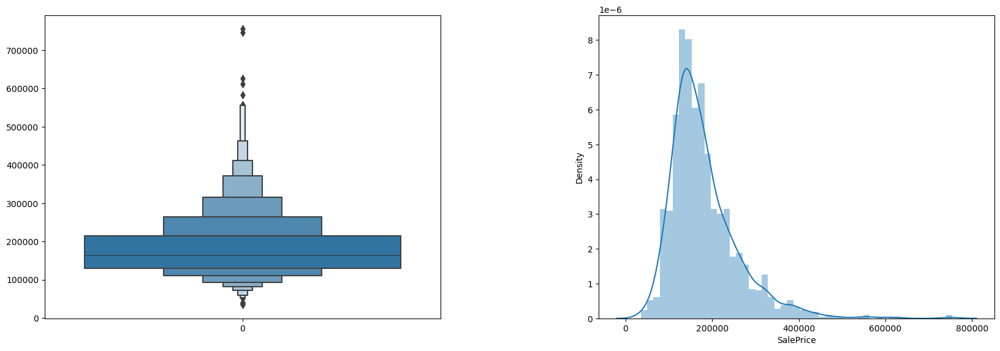

 Stats
Mean:  180624
Median: 162500.0
Mode: 140000
Outliers : 

 [34900, 79500, 108959, 110000, 119000, 119500, 132000, 140000, 148000, 154000, 155000, 171000, 191000, 196500, 200000, 216000, 392000, 402000, 438780, 475000, 501837]


In [28]:
## Check check_distribution_and_outliers in SalePrices
check_distribution_and_outliers(pDataOfAFeature= house_sales.SalePrice, pZScoreThreshold = 3)

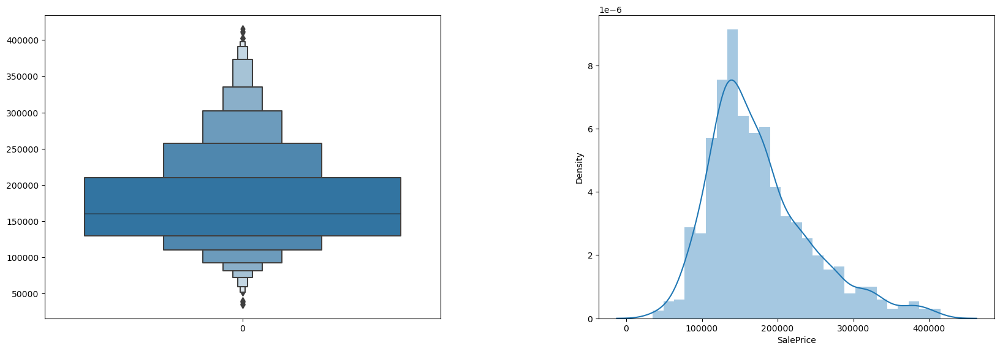

In [29]:
# Let's remove outliers in SalePrice which are not falling 99.7% bucket of the data distriution using Z score
house_sales = remove_outlier_in_feature(pDataFrame = house_sales, pFeature= 'SalePrice', pZScore = 3)

In [30]:
house_sales[['LotArea','SalePrice']].corr()

,LotArea,SalePrice
LotArea,1.000000,0.253922
SalePrice,0.253922,1.000000


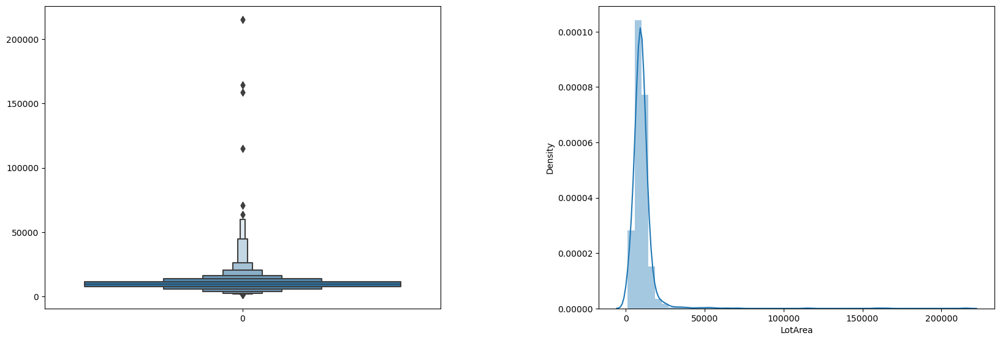

 Stats
Mean:  10394
Median: 9391.0
Mode: 7200
Outliers : 

 [45600, 46589, 50271, 53107, 53227, 57200, 63887, 70761, 115149, 159000, 164660, 215245]


In [31]:
# ## Check check_distribution_and_outliers in LotArea
check_distribution_and_outliers(pDataOfAFeature= house_sales.LotArea, pZScoreThreshold=3)

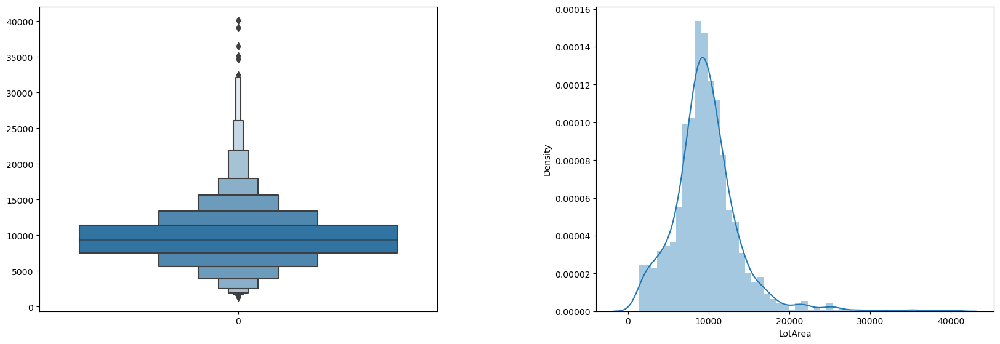

In [32]:
# Let's remove outliers in LotArea which are not falling 99.7% bucket of the data distriution using Z score
# There are about 12 outliers
house_sales = remove_outlier_in_feature(pDataFrame = house_sales, pFeature= 'LotArea', pZScore = 3)

In [33]:
# check the shape of data frame now
print('Dataset shape', house_sales.shape)
print("Total number of outlier removed from data set is : ", 1460 - house_sales.shape[0])
print("Total % of outlier removed from data set is : ", round(100 - (house_sales.shape[0] / 1460 * 100 ), 2), '%')

Dataset shape (1418, 79)
Total number of outlier removed from data set is :  42
Total % of outlier removed from data set is :  2.88 %


In [34]:
def get_zero_counts_of_features(*,pDataFrame : pd.DataFrame) :
    print('Total number of zero values in numeric feature, if they have any zero values')
    df_Features_With_Count_Of_Zero = pd.DataFrame(columns = ['Feature','Total Zero Count'])
    for feature in pDataFrame.columns :
        if (pDataFrame[feature] == 0).mean() > 0 :
            df_Features_With_Count_Of_Zero.loc[len(df_Features_With_Count_Of_Zero)] = (feature, round((pDataFrame[feature] == 0).mean() * 100, 2))
    return df_Features_With_Count_Of_Zero.sort_values(by='Total Zero Count', ascending=False)


# Let's check the % of zeros, if any, for all the numeric features.
get_zero_counts_of_features(pDataFrame=house_sales)

Total number of zero values in numeric feature, if they have any zero values


,Feature,Total Zero Count
21,PoolArea,99.65
19,3SsnPorch,98.31
6,LowQualFinSF,98.24
22,MiscVal,96.47
8,BsmtHalfBath,94.36
20,ScreenPorch,92.17
2,BsmtFinSF2,88.58
18,EnclosedPorch,85.61
10,HalfBath,63.26
0,MasVnrArea,59.80


### Remove PoolArea as it is having 99.62% zero value and there is PoolQC, which can represent whether pool exist or not along with Quality. NA repressent No Pool
#### Below feature have mostly zero value and they will not add any value, Deriving a feature out of these to say whethe it exist or not by having Yes/No will also not add any value as it's gonna be almost all the time a no, which will lead to skewed distribution
#### let's remove these
1. 3SsnPorch
2. LowQualFinSF
3. MiscVal
4. BsmtHalfBath
5. ScreenPorch
6. BsmtFinSF2
7. EnclosedPorch
8. HalfBath

In [35]:
house_sales[['PoolArea','3SsnPorch', 'LowQualFinSF','MiscVal','BsmtHalfBath','ScreenPorch','BsmtFinSF2','EnclosedPorch', 'HalfBath','MasVnrArea','BsmtFullBath','SalePrice']].corr()['SalePrice']

PoolArea         0.042772
3SsnPorch        0.064407
LowQualFinSF    -0.059346
MiscVal         -0.019359
BsmtHalfBath    -0.028188
ScreenPorch      0.096196
BsmtFinSF2      -0.013998
EnclosedPorch   -0.138527
HalfBath         0.280595
MasVnrArea       0.426875
BsmtFullBath     0.217735
SalePrice        1.000000
Name: SalePrice, dtype: float64

In [36]:
# Drop 'PoolArea','3SsnPorch', 'LowQualFinSF','MiscVal','BsmtHalfBath','ScreenPorch','BsmtFinSF2','EnclosedPorch' as they will not add any value
house_sales.drop(columns = ['PoolArea','3SsnPorch', 'LowQualFinSF','MiscVal','BsmtHalfBath','ScreenPorch','BsmtFinSF2','EnclosedPorch','HalfBath','MasVnrArea','BsmtFullBath'], inplace = True)

### Below numeric Features are have 32-57%  zero values
Let's add a new categorical Yes/No feature to just represent them as they will not add much value as numerical features.
1. BsmtFinSF1	
2. OpenPorchSF	
3. Fireplaces	
4. WoodDeckSF	
5. 2ndFlrSF 

In [37]:
# Let's  check the correlation of the feature which have 30-62% or more zero values
feature_with_32To57_percent_zero_values =  list(['BsmtFinSF1','OpenPorchSF','Fireplaces','WoodDeckSF','2ndFlrSF'])
round(house_sales[feature_with_32To57_percent_zero_values + ['SalePrice']].corr()['SalePrice'],2)

BsmtFinSF1     0.35
OpenPorchSF    0.32
Fireplaces     0.46
WoodDeckSF     0.32
2ndFlrSF       0.29
SalePrice      1.00
Name: SalePrice, dtype: float64

In [38]:
# The correlation of feature_With_More_Than_30To62_Percent_Zero_Values with SalePrice is not that great
# Let's add a new categorical Yes/No feature to just represent them to say whether it exist or not.

dict_feature_with_32To57_percent_zero_values = dict([(feature , f'cat_{feature}') for feature in feature_with_32To57_percent_zero_values])

feature_with_32To57_percent_zero_values = [ f'cat_{feature}' for feature in feature_with_32To57_percent_zero_values]

house_sales.rename(columns = dict_feature_with_32To57_percent_zero_values, inplace = True)

house_sales.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,cat_BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,cat_2ndFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,cat_Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,cat_WoodDeckSF,cat_OpenPorchSF,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,N A,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,GasA,Ex,Y,SBrkr,856,854,1710,2,3,1,Gd,8,Typ,0,N A,Attchd,RFn,2,548,TA,TA,Y,0,61,N A,N A,N A,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,N A,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,2,3,1,TA,6,Typ,1,TA,Attchd,RFn,2,460,TA,TA,Y,298,0,N A,N A,N A,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,N A,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,GasA,Ex,Y,SBrkr,920,866,1786,2,3,1,Gd,6,Typ,1,TA,Attchd,RFn,2,608,TA,TA,Y,0,42,N A,N A,N A,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,N A,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,3,642,TA,TA,Y,0,35,N A,N A,N A,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,N A,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,2,4,1,Gd,9,Typ,1,TA,Attchd,RFn,3,836,TA,TA,Y,192,84,N A,N A,N A,12,2008,WD,Normal,250000


In [39]:
# Update non zero as 1 to represent the feature exist. 0 will represent that the feature doesn’t exist
house_sales[feature_with_32To57_percent_zero_values] = house_sales[feature_with_32To57_percent_zero_values].applymap(lambda x : 1 if x != 0 else 0 )
house_sales[feature_with_32To57_percent_zero_values] = house_sales[feature_with_32To57_percent_zero_values].astype('category')
house_sales[feature_with_32To57_percent_zero_values].head(10)

,cat_BsmtFinSF1,cat_OpenPorchSF,cat_Fireplaces,cat_WoodDeckSF,cat_2ndFlrSF
0,1,1,0,0,1
1,1,0,1,1,0
2,1,1,1,0,1
3,1,1,1,0,1
4,1,1,1,1,1
5,1,1,0,1,1
6,1,1,1,1,0
7,1,1,1,1,1
8,0,0,1,1,1
9,1,1,1,0,0


In [40]:
# Curious to see after how many years the houses are remodeled and want to know if there is a correlation of it with SalePrice
house_sales['YearBuilt_Minus_YearRemodAdd'] = house_sales.YearBuilt  - house_sales.YearRemodAdd

# check to see if there is a relation with YearSold_Minus_YearBuilt SalePrice
house_sales['YearSold_Minus_YearBuilt'] = house_sales.YrSold - house_sales.YearBuilt 


house_sales[['YearBuilt','YrSold','YearRemodAdd','YearBuilt_Minus_YearRemodAdd','YearSold_Minus_YearBuilt','SalePrice']].corr()

,YearBuilt,YrSold,YearRemodAdd,YearBuilt_Minus_YearRemodAdd,YearSold_Minus_YearBuilt,SalePrice
YearBuilt,1.000000,-0.015388,0.588498,0.731885,-0.999028,0.567364
YrSold,-0.015388,1.000000,0.038997,-0.051763,0.059439,-0.018183
YearRemodAdd,0.588498,0.038997,1.000000,-0.120221,-0.585809,0.543941
YearBuilt_Minus_YearRemodAdd,0.731885,-0.051763,-0.120221,1.000000,-0.732959,0.238209
YearSold_Minus_YearBuilt,-0.999028,0.059439,-0.585809,-0.732959,1.000000,-0.567229
SalePrice,0.567364,-0.018183,0.543941,0.238209,-0.567229,1.000000


In [41]:
# YrSold is not adding any value and it's adding a value with derived feature YearSold_Minus_YearBuilt.
# Remove YrSold
house_sales.drop(columns = ['YrSold'], inplace = True)


In [42]:
# Check for missing values, data type in the whole data set
print_feature_name_of_missing_values(pDataFrame=house_sales,pExcludeCategory = 'category')

 There is no feature with a missing value 


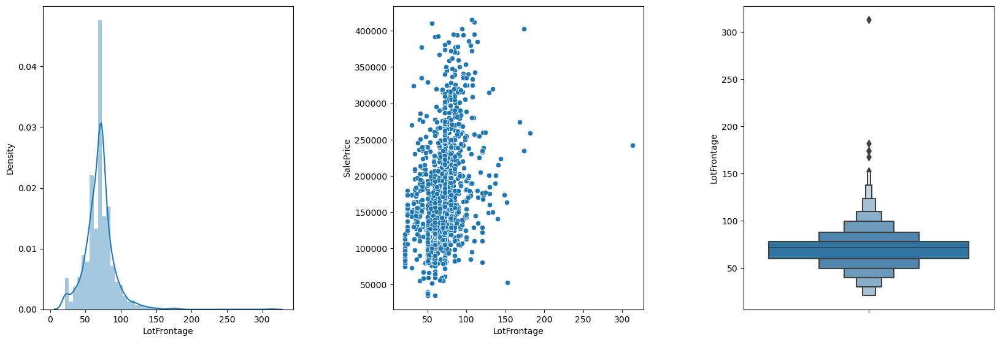

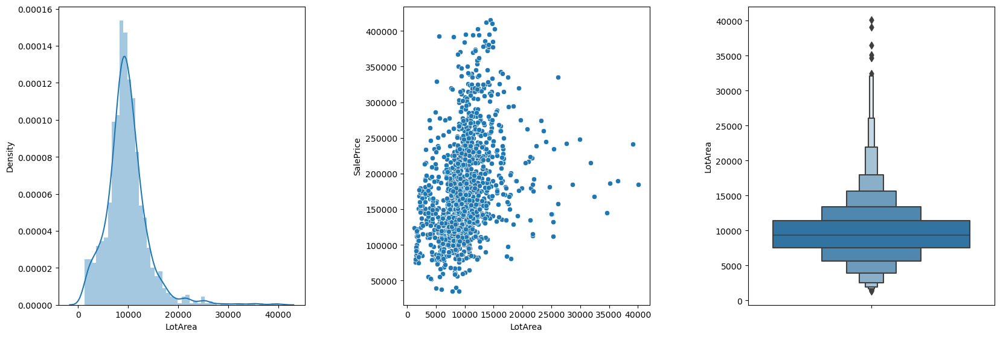

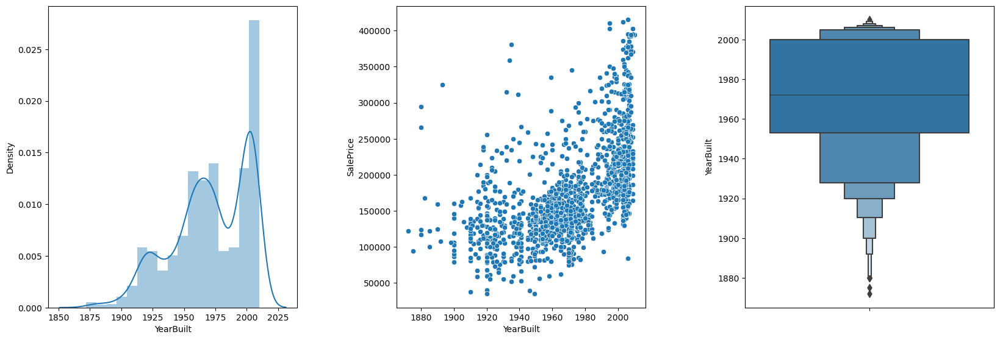

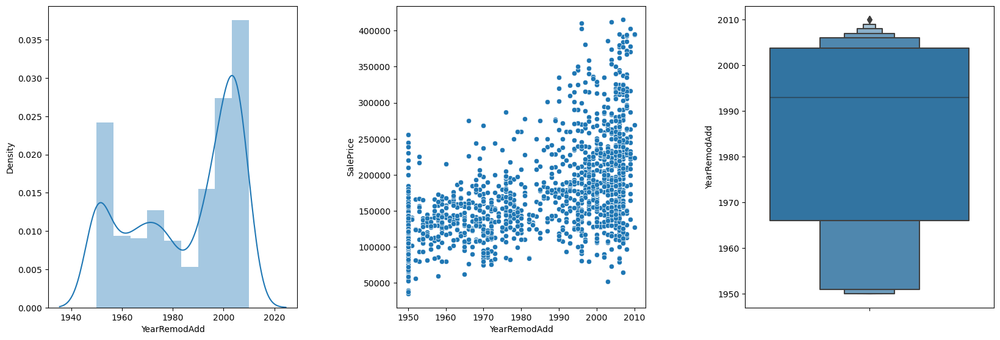

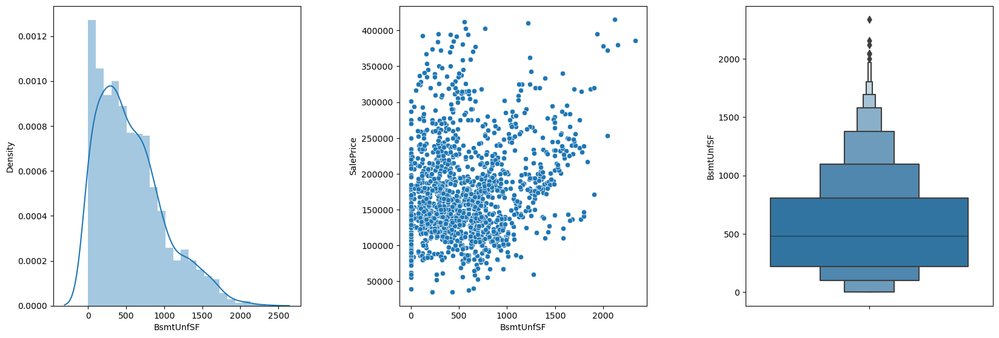

...

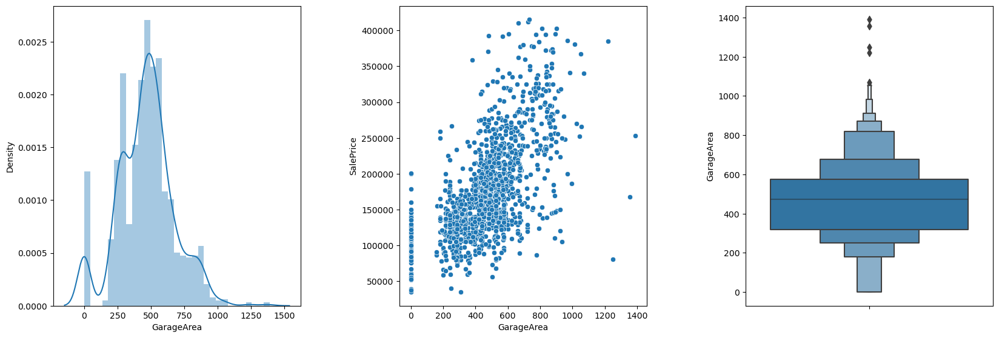

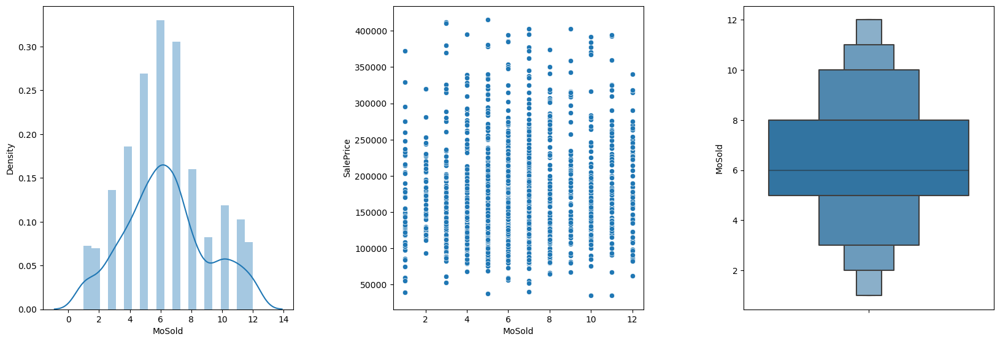

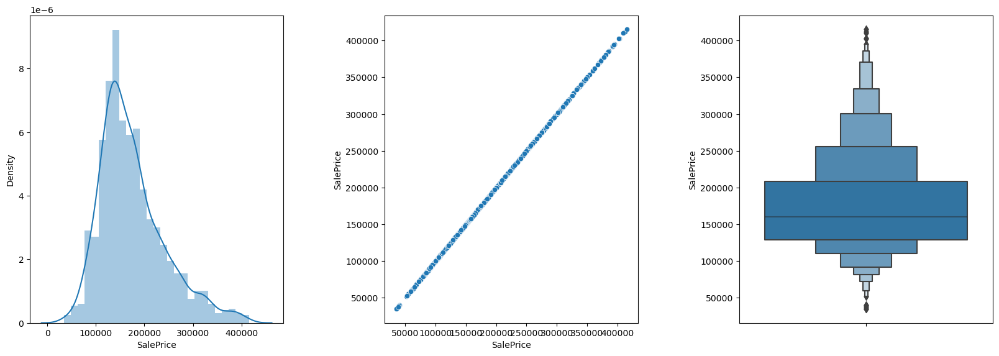

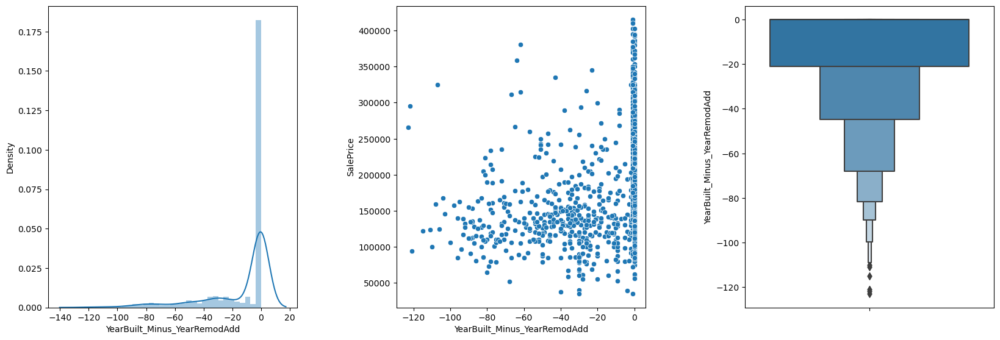

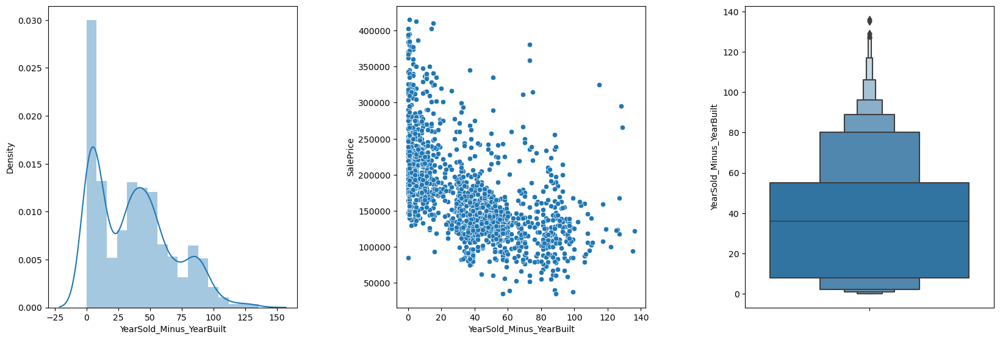

In [43]:
# Let's visualize the distribution of numerical and ordinal categorical features along with 'SalePrice'
def visualize_numeric_features(*,pDataFrame, pDependentFeature):
    feature_list = pDataFrame.columns[:]
    if pDependentFeature not in feature_list:
        feature_list.append(pDependentFeature)
    for feature in feature_list :
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=False,figsize=(20,5))
        plt.subplots_adjust(top = 1, bottom=0.01, hspace=0.01, wspace=0.4)
        sns.distplot(house_sales[feature], ax = ax1)
        sns.scatterplot(ax = ax2, x = pDataFrame[feature], y = pDataFrame[pDependentFeature])
#         sns.regplot(ax = ax2, x = pDataFrame[feature], y = pDataFrame[pDependentFeature])
#         ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
        sns.boxenplot(ax = ax3, data = pDataFrame, y = feature)
        plt.show()
            
visualize_numeric_features(pDataFrame = house_sales.select_dtypes(exclude='category'), pDependentFeature = 'SalePrice')

In [44]:
# GarageArea and GarageCars are almost redundant, let's remove GarageArea
house_sales.drop(columns='GarageArea', inplace=True)
print(house_sales.shape)
# check and drop duplicates
house_sales.drop_duplicates(inplace=True)
print(house_sales.shape)

(1418, 68)
(1418, 68)


## Let's analyze the categorical features.

### After checking the data dictionary, we can clearly identify below features as ordinal categorical

1. LotShape: General shape of property      
2. LandContour: Flatness of the property
3. Utilities: Type of utilities available
4. LandSlope: Slope of property		
5. HouseStyle: Style of dwelling
6. ExterQual: Evaluates the quality of the material on the exterior 
7. ExterCond: Evaluates the present condition of the material on the exterior
8. BsmtQual: Evaluates the height of the basement
9. BsmtCond: Evaluates the general condition of the basement
10. BsmtExposure: Refers to walkout or garden level walls
11. BsmtFinType1: Rating of basement finished area
12. BsmtFinType2: Rating of basement finished area (if multiple types)
13. HeatingQC: Heating quality and condition
14. KitchenQual: Kitchen quality
15. Functional: Home functionality (Assume typical unless deductions are warranted)
16. FireplaceQu: Fireplace quality
17. GarageFinish: Interior finish of the garage
18. GarageQual: Garage quality
19. GarageCond: Garage condition
20. PavedDrive: Paved driveway
21. PoolQC: Pool quality
22. Fence: Fence quality
23. OverallQual: Rates the overall material and finish of the house
24. OverallCond: Rates the overall condition of the house

### Let's encode the ordinal features

In [45]:
# Encoding ordinal categorical features

LotShape_scale_mapper = {"IR3":1, "IR2":2, "IR1":3, "Reg":4}
house_sales.LotShape = house_sales.LotShape.replace(LotShape_scale_mapper)

LandContour_scale_mapper = {"Low":1, "HLS":2, "Bnk":3, "Lvl":4}
house_sales.LandContour = house_sales.LandContour.replace(LandContour_scale_mapper)

Utilities_scale_mapper = {"ELO":1, "NoSeWa":2, "NoSewr":3, "AllPub":4}
house_sales.Utilities = house_sales.Utilities.replace(Utilities_scale_mapper)

LandSlope_scale_mapper = {"Gtl":1, "Mod":2, "Sev":3}
house_sales.LandSlope = house_sales.LandSlope.replace(LandSlope_scale_mapper)

HouseStyle_scale_mapper = {"1Story":1, "1.5Fin":2, "1.5Unf":3, "2Story":4,"2.5Fin":5, "2.5Unf":6 ,"SFoyer":7, "SLvl":8}
house_sales.HouseStyle = house_sales.HouseStyle.replace(HouseStyle_scale_mapper)

ExterQual_Cond_scale_mapper = {"Po":1, "Fa":2, "TA":3, "Gd":4, "Ex":5}
house_sales.ExterQual = house_sales.ExterQual.replace(ExterQual_Cond_scale_mapper)
house_sales.ExterCond = house_sales.ExterCond.replace(ExterQual_Cond_scale_mapper)

BsmtQual_Cond_scale_mapper = {"N A":1, "Po":2, "Fa":3, "TA":4, "Gd":5, "Ex":6}
house_sales.BsmtQual = house_sales.BsmtQual.replace(BsmtQual_Cond_scale_mapper)
house_sales.BsmtCond = house_sales.BsmtCond.replace(BsmtQual_Cond_scale_mapper)
  
BsmtExposure_scale_mapper = {"N A":1, "No":2, "Mn":3, "Av":4, "Gd":5}
house_sales.BsmtExposure = house_sales.BsmtExposure.replace(BsmtExposure_scale_mapper)

BsmtFinType1_2_scale_mapper = {"N A":1, "Unf":2, "LwQ":3, "Rec":4, "BLQ":5, "ALQ":6, "GLQ":7}
house_sales.BsmtFinType1 = house_sales.BsmtFinType1.replace(BsmtFinType1_2_scale_mapper)
house_sales.BsmtFinType2 = house_sales.BsmtFinType2.replace(BsmtFinType1_2_scale_mapper)

Heating_Kitchen_QC_scale_mapper = {"Po":1, "Fa":2, "TA":3, "Gd":4, "Ex":5}
house_sales.HeatingQC = house_sales.HeatingQC.replace(Heating_Kitchen_QC_scale_mapper)
house_sales.KitchenQual = house_sales.KitchenQual.replace(Heating_Kitchen_QC_scale_mapper)

Functional_scale_mapper= {"Sal":1, "Sev":2, "Maj2":3, "Maj1":4, "Mod":5, "Min2":6, "Min1":7, "Typ":8}
house_sales.Functional = house_sales.Functional.replace(Functional_scale_mapper)

FireplaceQu_scale_mapper = {"N A":1, "Po":2, "Fa":3, "TA":4, "Gd":5, "Ex":6}
house_sales.FireplaceQu = house_sales.FireplaceQu.replace(FireplaceQu_scale_mapper)

GarageFinish_scale_mapper = {"N A":1, "Unf":2, "RFn":3, "Fin":4}
house_sales.GarageFinish = house_sales.GarageFinish.replace(GarageFinish_scale_mapper)

Garage_Qual_Cond_scale_mapper = {"N A":1, "Po":2, "Fa":3, "TA":4, "Gd":5, "Ex":6}
house_sales.GarageQual = house_sales.GarageQual.replace(Garage_Qual_Cond_scale_mapper)
house_sales.GarageCond = house_sales.GarageCond.replace(Garage_Qual_Cond_scale_mapper)

PavedDrive_scale_mapper = {"N":1, "P":2, "Y":3}
house_sales.PavedDrive = house_sales.PavedDrive.replace(PavedDrive_scale_mapper)

Pool_Qual_scale_mapper = {"N A":1, "Fa":2, "TA":3, "Gd":4, "Ex":5}
house_sales.PoolQC = house_sales.PoolQC.replace(Pool_Qual_scale_mapper)

Fence_scale_mapper = {"N A":1, "MnWw":2, "GdWo":3, "MnPrv":4, "GdPrv":5}
house_sales.Fence = house_sales.Fence.replace(Fence_scale_mapper)



In [46]:

# Find all numeric, ordinal nominal features
# Numerics
numeric_features = house_sales.select_dtypes(exclude='category').columns
# Ordinals
ordinal_features = ['LotShape','LandContour','Utilities','LandSlope','HouseStyle','ExterQual','ExterCond', \
'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual', \
'Functional','FireplaceQu', 'GarageFinish','GarageQual','GarageCond','PavedDrive','PoolQC', \
'Fence','OverallQual','OverallCond']

# Update ordinal_features data type as int
house_sales[ordinal_features] = house_sales[ordinal_features].astype(int)
# Nominals
nominal_features = house_sales.select_dtypes(include='category').columns

df_features = pd.DataFrame(data=list(itertools.zip_longest(nominal_features, numeric_features, ordinal_features, fillvalue='  ')),columns=['Nominal_features','Numeric_features','Ordinal_features'])
print(len(house_sales.columns))
print(len(numeric_features) + len(ordinal_features) + len(nominal_features))
df_features

68
68


,Nominal_features,Numeric_features,Ordinal_features
0,MSSubClass,LotFrontage,LotShape
1,MSZoning,LotArea,LandContour
2,Street,YearBuilt,Utilities
3,Alley,YearRemodAdd,LandSlope
4,LotConfig,BsmtUnfSF,HouseStyle
5,Neighborhood,TotalBsmtSF,ExterQual
6,Condition1,1stFlrSF,ExterCond
7,Condition2,GrLivArea,BsmtQual
8,BldgType,FullBath,BsmtCond
9,RoofStyle,BedroomAbvGr,BsmtExposure


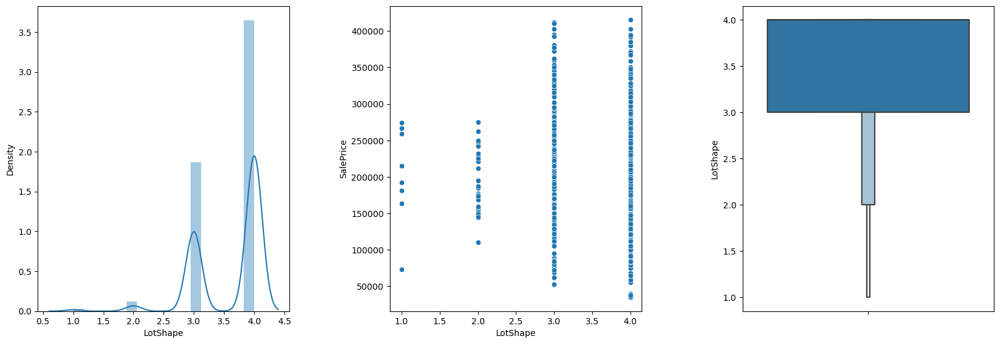

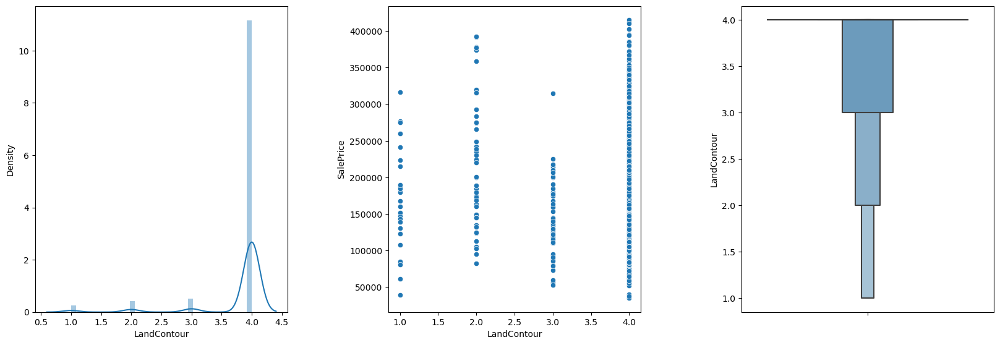

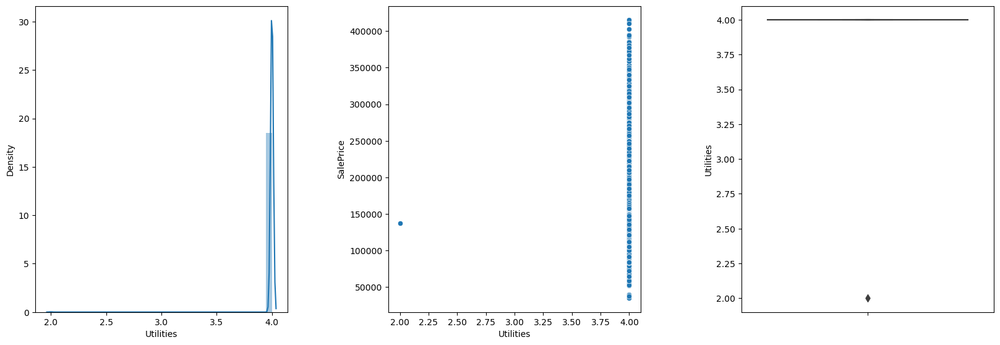

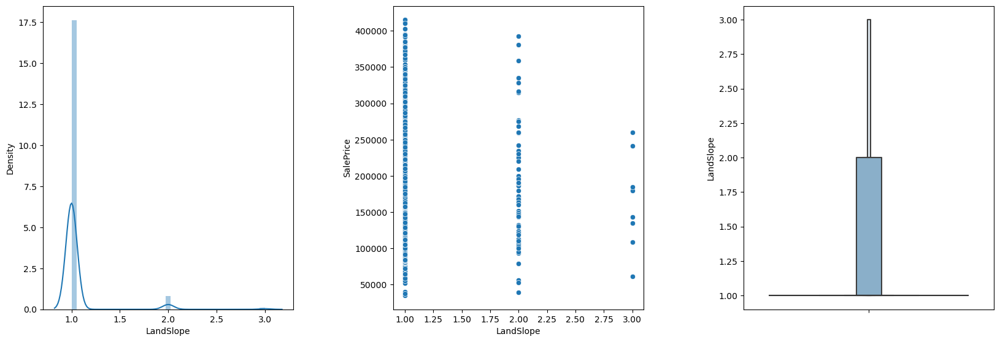

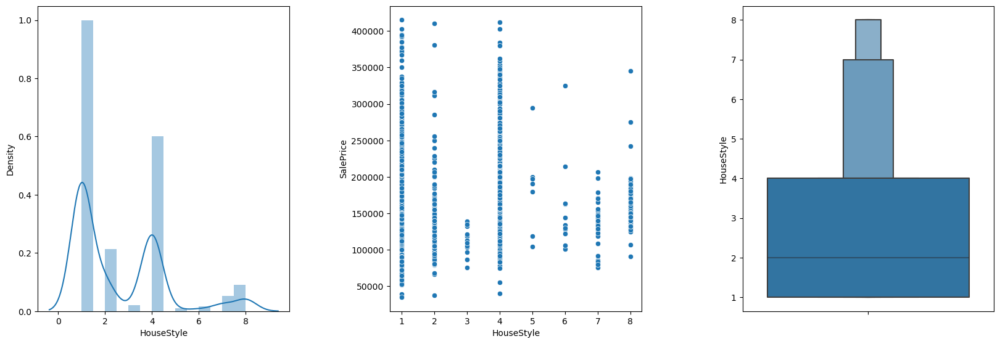

...

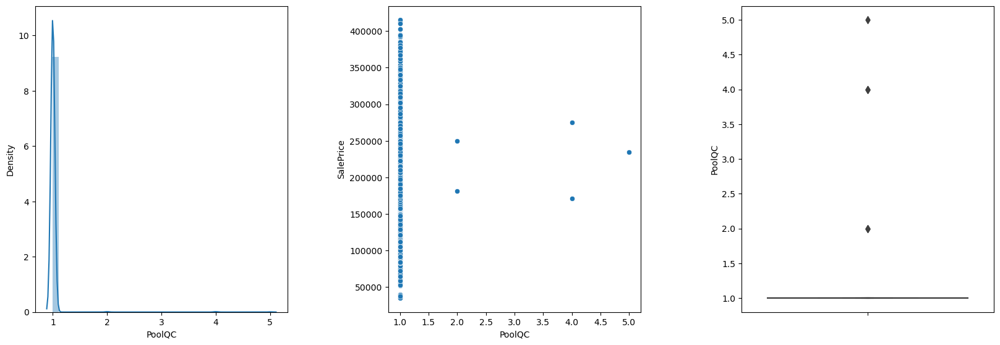

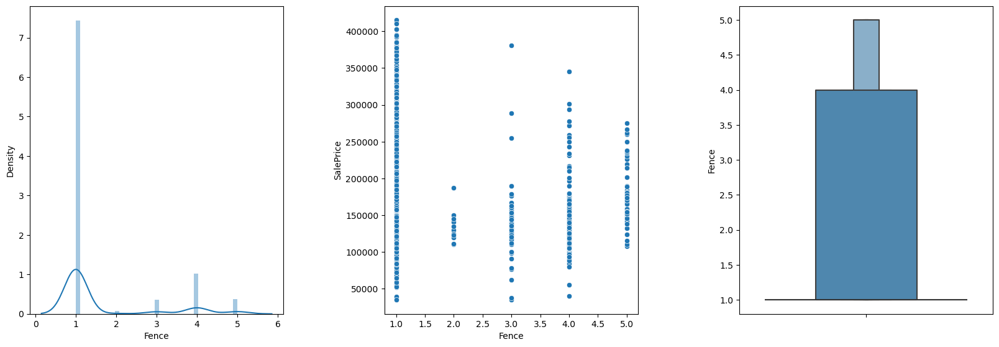

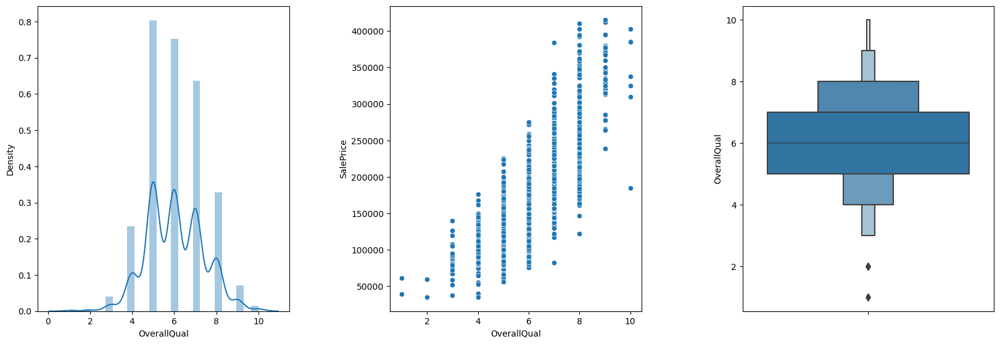

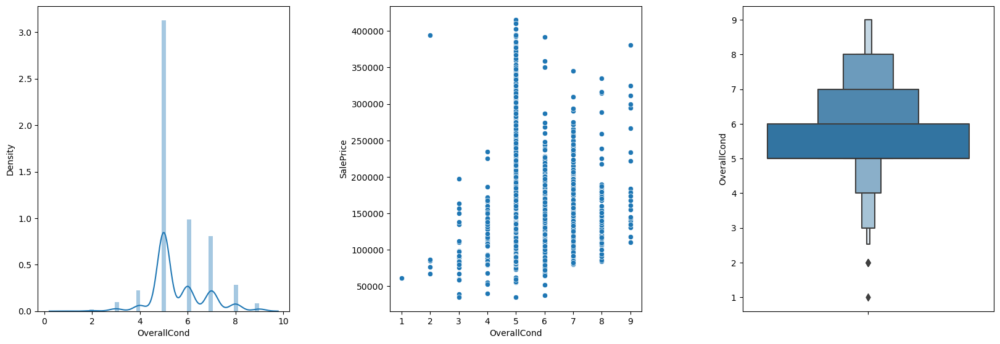

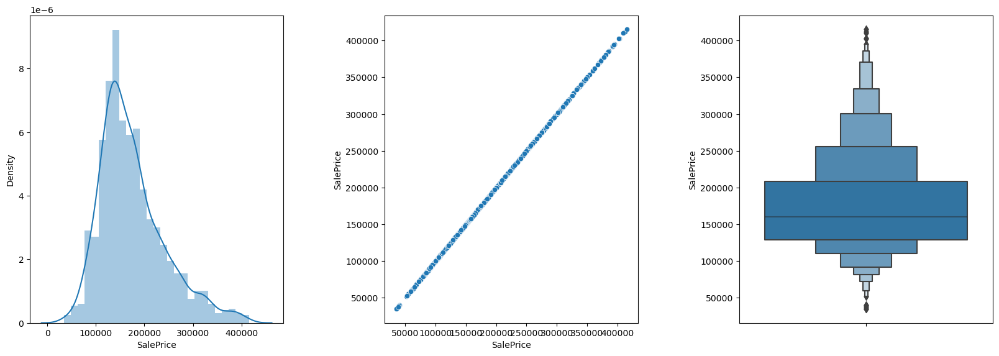

In [47]:
# Let's visualize ordinal features
ordinal_features_with_SalePrice = ordinal_features + ['SalePrice']
visualize_numeric_features(pDataFrame=house_sales[ordinal_features_with_SalePrice], pDependentFeature='SalePrice')

#### From the above plots, we can clearly see that data is skewed for some of the features.
#### Almost all the houses has AllPub : All public Utilities (E,G,W,& S)
#### Almost all the houses has PoolQC is NA, which tell Pool doesn't exist
#### Better, to remove these features

In [48]:
house_sales.drop(columns=['Utilities','PoolQC'], inplace=True)

In [49]:
# Let's check the % of zeros, if any, for all the numeric features.
get_zero_counts_of_features(pDataFrame = house_sales.select_dtypes(exclude = 'category'))

Total number of zero values in numeric feature, if they have any zero values


,Feature,Total Zero Count
6,YearBuilt_Minus_YearRemodAdd,52.75
0,BsmtUnfSF,8.32
5,GarageCars,5.71
7,YearSold_Minus_YearBuilt,4.23
1,TotalBsmtSF,2.61
2,FullBath,0.56
3,BedroomAbvGr,0.35
4,KitchenAbvGr,0.07


### Zero values for below features are valid and no need of imputation
1. YearBuilt_Minus_YearRemodAdd
2. BsmtUnfSF
3. GarageCars
4. YearSold_Minus_YearBuilt
5. TotalBsmtSF
6. FullBath
7. BedroomAbvGr
8. KitchenAbvGr

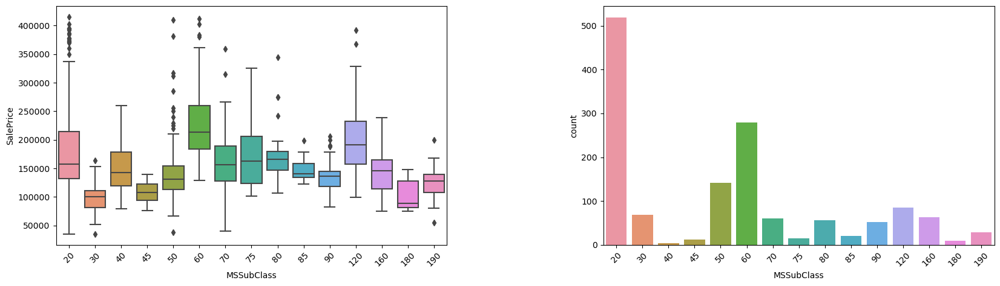

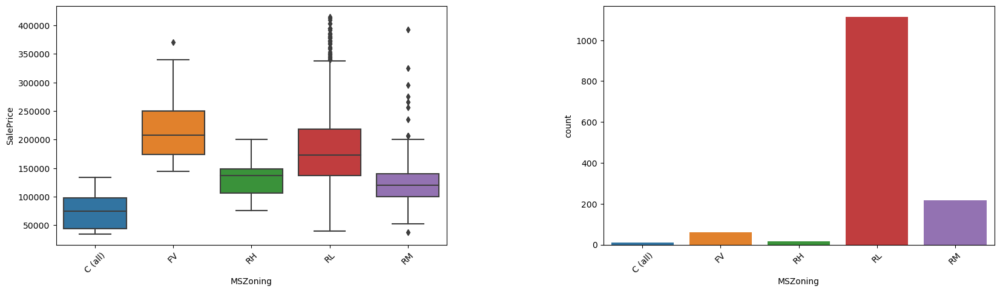

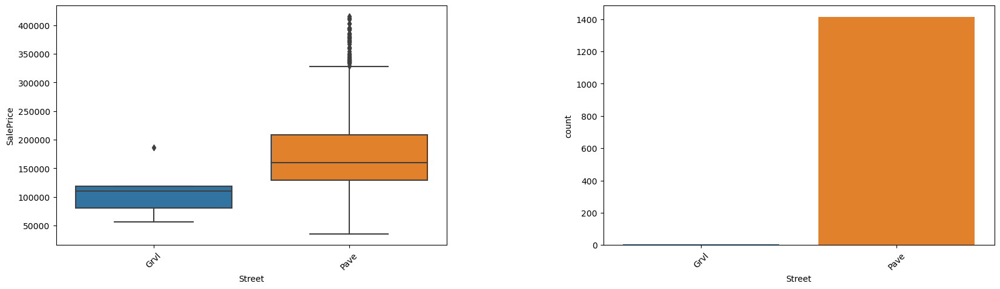

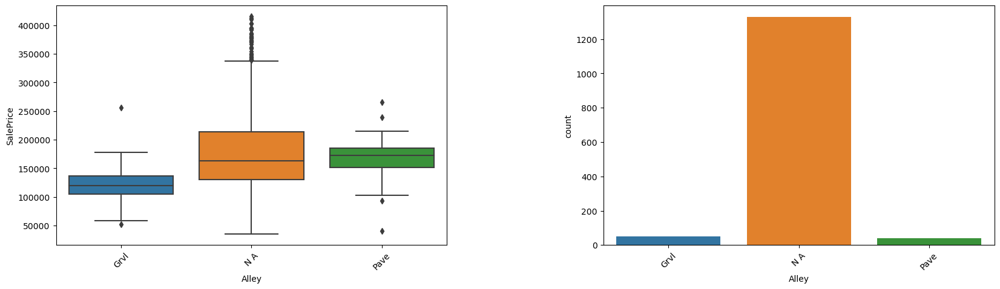

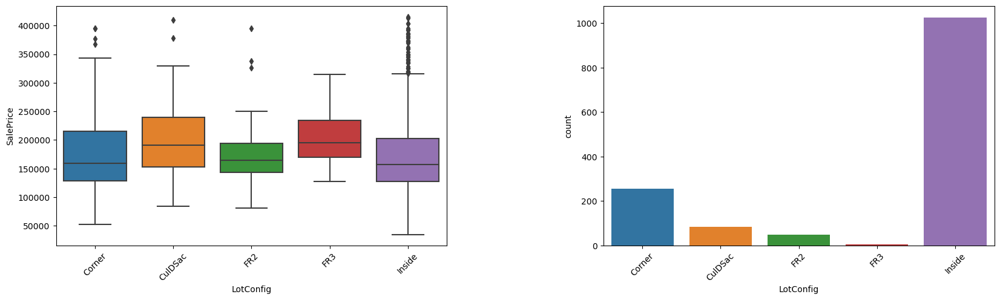

...

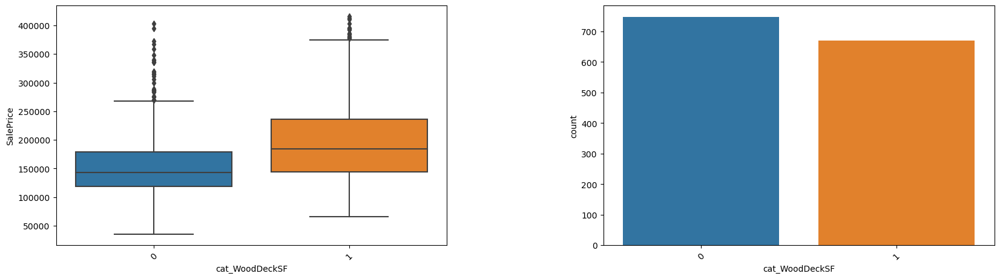

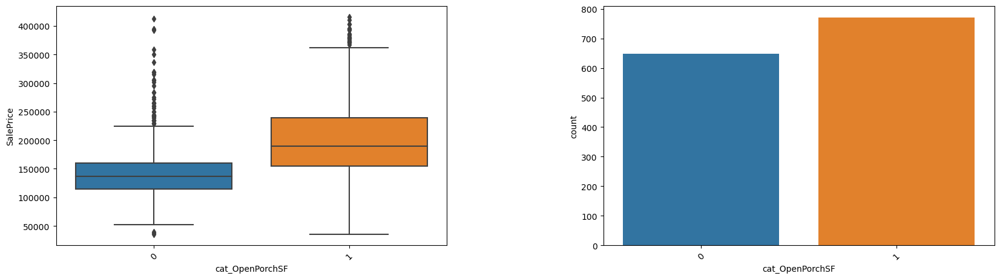

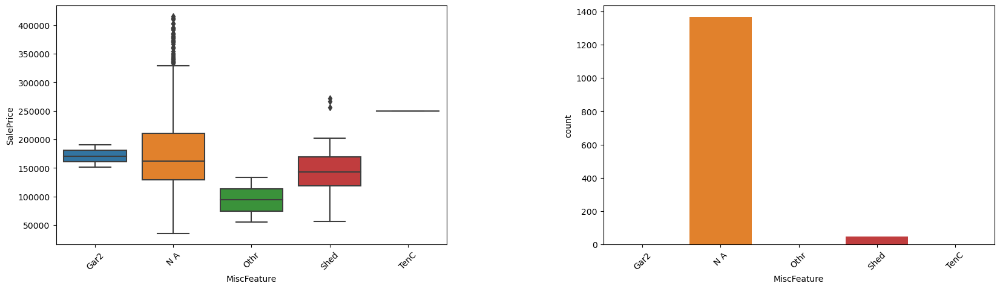

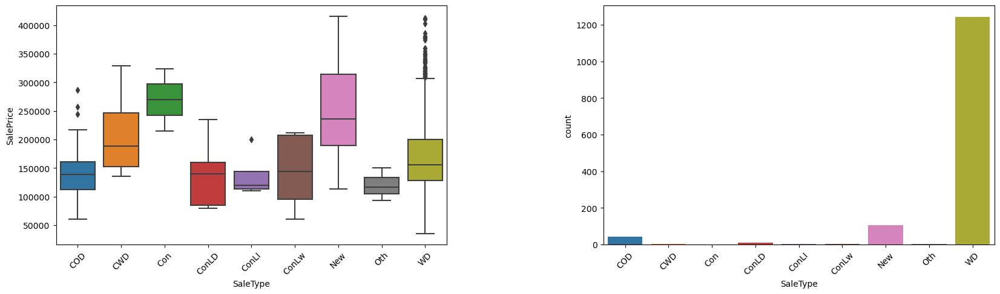

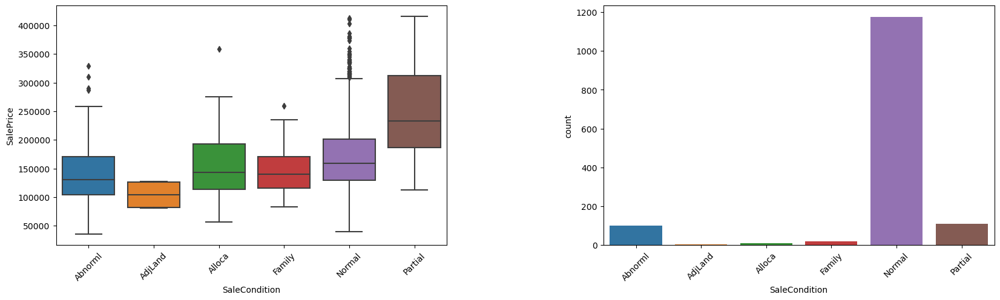

In [50]:
# Let's visualize categorical features
for feature in house_sales.select_dtypes(include='category').columns:
    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False,figsize=(20,4))
    plt.subplots_adjust(top = 1, bottom=0.01, hspace=0.01, wspace=0.4)
    sns.boxplot(data=house_sales, x = feature, y = "SalePrice", ax = ax1 )
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
    sns.countplot(data=house_sales, x=feature,  ax = ax2)
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
    plt.show()

### From the boxplot and countplot, we can see that the house sales are not distributed well across the categories of the below categorical features. These will not add much value, let's drop these categorical features
1. Street
2. Condition2
3. RoofMatl
4. Heating
5. MiscFeature
6. SaleType
7. SaleCondition

In [51]:
house_sales.drop(columns = ['Street','Condition2','RoofMatl','Heating','CentralAir','MiscFeature','SaleType','SaleCondition'], inplace = True)

In [52]:
print('Percentage of data in specific categories of categorical variable, when at least one category is occuring more than 80% \n\n')
feature_with_atleast_one_category_occuring_80percent = list()
for feature in house_sales.select_dtypes(include='category'):
    value_counts_categories = house_sales[feature].value_counts()
    for category in value_counts_categories.index:
        if ((value_counts_categories[category] / len(house_sales)) * 100 )> 80 :
            print(value_counts_categories, '\n')
            feature_with_atleast_one_category_occuring_80percent.append(feature)
            break
print('feature_with_atleast_one_category_occuring_80percent ', feature_with_atleast_one_category_occuring_80percent)

Percentage of data in specific categories of categorical variable, when at least one category is occuring more than 80% 


N A     1328
Grvl      50
Pave      40
Name: Alley, dtype: int64 

Norm      1222
Feedr       79
Artery      47
RRAn        25
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64 

1Fam      1180
TwnhsE     113
Duplex      52
Twnhs       43
2fmCon      30
Name: BldgType, dtype: int64 

SBrkr    1293
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64 

feature_with_atleast_one_category_occuring_80percent  ['Alley', 'Condition1', 'BldgType', 'Electrical']


#### In 5 categorical features ['Alley', 'Condition1', 'BldgType', 'Electrical'], we see that 80% of the times house is falling under a perticular category.
#### Let's drop below 5 features from the data set as they will not add much value.

In [53]:
house_sales.drop(columns = feature_with_atleast_one_category_occuring_80percent, inplace = True)

In [54]:
## check if we have any category that's not listed in the data dictionay
for feature in house_sales.select_dtypes(include='category').columns:
    print(feature, ": ",sorted(list(house_sales[feature].unique())))

MSSubClass :  [20, 30, 40, 45, 50, 60, 70, 75, 80, 85, 90, 120, 160, 180, 190]
MSZoning :  ['C (all)', 'FV', 'RH', 'RL', 'RM']
LotConfig :  ['Corner', 'CulDSac', 'FR2', 'FR3', 'Inside']
Neighborhood :  ['Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr', 'Crawfor', 'Edwards', 'Gilbert', 'IDOTRR', 'MeadowV', 'Mitchel', 'NAmes', 'NPkVill', 'NWAmes', 'NoRidge', 'NridgHt', 'OldTown', 'SWISU', 'Sawyer', 'SawyerW', 'Somerst', 'StoneBr', 'Timber', 'Veenker']
RoofStyle :  ['Flat', 'Gable', 'Gambrel', 'Hip', 'Mansard', 'Shed']
Exterior1st :  ['AsbShng', 'AsphShn', 'BrkComm', 'BrkFace', 'CBlock', 'CemntBd', 'HdBoard', 'ImStucc', 'MetalSd', 'Plywood', 'Stone', 'Stucco', 'VinylSd', 'Wd Sdng', 'WdShing']
Exterior2nd :  ['AsbShng', 'AsphShn', 'Brk Cmn', 'BrkFace', 'CBlock', 'CmentBd', 'HdBoard', 'ImStucc', 'MetalSd', 'Other', 'Plywood', 'Stone', 'Stucco', 'VinylSd', 'Wd Sdng', 'Wd Shng']
MasVnrType :  ['BrkCmn', 'BrkFace', 'None', 'Stone']
Foundation :  ['BrkTil', 'CBlock', 'PConc', 'Sl

### There are no category values in the categorical features which does not exist in data dictionary, which confirms that we do not have incorrect data

In [55]:
# Descibe to check the distribution one more time
house_sales.describe(percentiles=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.997]).round(2)


,LotFrontage,LotArea,LotShape,LandContour,LandSlope,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,FireplaceQu,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,Fence,MoSold,SalePrice,YearBuilt_Minus_YearRemodAdd,YearSold_Minus_YearBuilt
count,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00,1418.00
mean,69.90,9709.86,3.61,3.83,1.05,2.56,6.04,5.58,1970.71,1984.45,3.37,3.08,4.46,3.93,2.60,4.51,2.25,565.00,1035.25,4.13,1143.01,1487.47,1.55,2.86,1.05,3.49,6.46,7.84,2.78,2.69,1.74,3.80,3.80,2.85,1.58,6.33,174868.90,-13.74,37.11
std,20.89,4251.04,0.56,0.57,0.25,1.96,1.33,1.12,30.12,20.68,0.55,0.35,0.87,0.56,1.04,2.10,0.89,438.69,397.11,0.96,356.24,482.98,0.54,0.81,0.22,0.65,1.56,0.66,1.80,0.89,0.74,0.73,0.73,0.50,1.21,2.70,66911.33,24.53,30.17
min,21.00,1300.00,1.00,1.00,1.00,1.00,1.00,1.00,1872.00,1950.00,2.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00,334.00,334.00,0.00,0.00,0.00,2.00,2.00,2.00,1.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00,34900.00,-123.00,0.00
10%,48.70,5000.00,3.00,4.00,1.00,1.00,5.00,5.00,1924.00,1950.00,3.00,3.00,4.00,4.00,2.00,2.00,2.00,71.40,630.00,3.00,756.00,906.10,1.00,2.00,1.00,3.00,5.00,8.00,1.00,2.00,1.00,4.00,4.00,3.00,1.00,3.00,105970.00,-51.00,1.00
20%,58.00,7024.00,3.00,4.00,1.00,1.00,5.00,5.00,1946.00,1961.00,3.00,3.00,4.00,4.00,2.00,2.00,2.00,172.00,747.00,3.00,847.40,1056.00,1.00,2.00,1.00,3.00,5.00,8.00,1.00,2.00,1.00,4.00,4.00,3.00,1.00,4.00,123000.00,-30.00,5.00
30%,60.00,7991.00,3.00,4.00,1.00,1.00,5.00,5.00,1957.00,1970.00,3.00,3.00,4.00,4.00,2.00,2.00,2.00,279.10,832.00,3.00,912.00,1199.10,1.00,3.00,1.00,3.00,6.00,8.00,1.00,2.00,1.00,4.00,4.00,3.00,1.00,5.00,135000.00,-9.00,11.00
40%,68.00,8754.00,4.00,4.00,1.00,1.00,6.00,5.00,1965.00,1979.00,3.00,3.00,4.00,4.00,2.00,4.00,2.00,374.80,896.00,4.00,990.00,1324.00,1.00,3.00,1.00,3.00,6.00,8.00,1.00,2.00,2.00,4.00,4.00,3.00,1.00,6.00,145000.00,-1.00,26.80
50%,72.00,9362.00,4.00,4.00,1.00,2.00,6.00,5.00,1972.00,1993.00,3.00,3.00,4.00,4.00,2.00,5.00,2.00,480.50,980.00,4.00,1077.00,1449.00,2.00,3.00,1.00,3.00,6.00,8.00,3.00,3.00,2.00,4.00,4.00,3.00,1.00,6.00,160000.00,0.00,36.00
60%,72.00,10125.00,4.00,4.00,1.00,2.00,6.00,5.00,1981.00,1998.00,3.00,3.00,5.00,4.00,2.00,6.00,2.00,604.20,1073.20,5.00,1164.20,1564.40,2.00,3.00,1.00,4.00,7.00,8.00,4.00,3.00,2.00,4.00,4.00,3.00,1.00,7.00,177000.00,0.00,43.00


### From the above statistcs of numerical and ordinal categorical independent features and dependent feature "SalePrice". We can see that the data is spread out pretty good upto 95%. But, we see outliers in last 5% from the stats above
<!-- but we do see ouin most of the features and the data could be used to build a model. -->

In [56]:
# Let's check the features with very less correlation, from -0.05 to 0.05
corr_matrix = house_sales.corr().round(2)
features = corr_matrix.columns
print('Correlation of feature with SalePrice')
for feature in features :
    if corr_matrix[feature]['SalePrice'] > -0.05 and (corr_matrix[feature]['SalePrice'] < 0.05) :
            print(feature,' : ',  corr_matrix[feature]['SalePrice'])

Correlation of feature with SalePrice
LandSlope  :  0.03
ExterCond  :  0.02
BsmtFinType2  :  -0.01


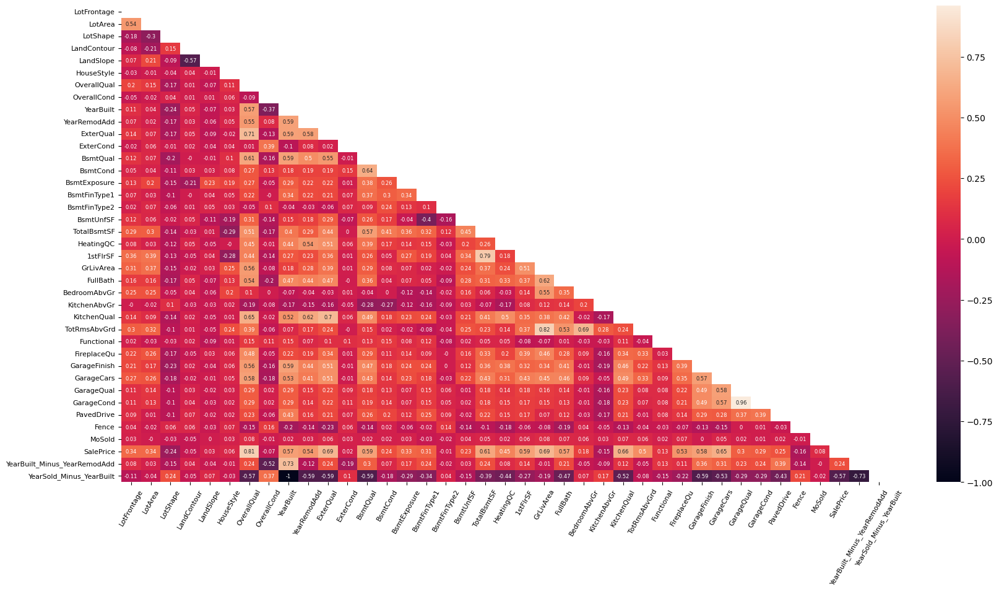

In [57]:
# Check correlation and plot heatmap
def heatmap_with_mask(*,pDataFrame): 
    correlation_matrix = pDataFrame.corr().round(2)
    # Heatmap of correlations
    mask = np.triu(np.ones_like(correlation_matrix))
    plt.figure(figsize=(20,10))
    res = sns.heatmap(correlation_matrix, annot=True,mask = mask, annot_kws={'size':6})
    res.set_xticklabels(res.get_xmajorticklabels(), fontsize = 8, rotation = 60)
    res.set_yticklabels(res.get_ymajorticklabels(), fontsize = 8, rotation = 0)
    plt.show()

heatmap_with_mask(pDataFrame=house_sales)

#### We can see a strong multicollinearity between below independent features
1. ExternQual and OverallQual
2. 1stFlrSF and TotalBsmtSF
3. TotRmsAbvGrd and GrLivArea
4. TotRmsAbvGrd and BedroomAbvGr

In [58]:
# Create dummies for categorical features
house_sales_categorical = house_sales.select_dtypes(include='category')
house_sales_dummies = pd.get_dummies(house_sales_categorical, drop_first=True)
house_sales_dummies.head()

,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,cat_BsmtFinSF1_1,cat_2ndFlrSF_1,cat_Fireplaces_1,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_N A,cat_WoodDeckSF_1,cat_OpenPorchSF_1
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,1,1,0,0,0,0,0,0,1
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,1
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,1,1,0,0,0,0,0,1,1


In [59]:
# Drop categorical variable columns
house_sales.drop(columns = list(house_sales_categorical.columns), axis=1, inplace = True)
house_sales.head()

,LotFrontage,LotArea,LotShape,LandContour,LandSlope,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,FireplaceQu,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,Fence,MoSold,SalePrice,YearBuilt_Minus_YearRemodAdd,YearSold_Minus_YearBuilt
0,65.0,8450,4,4,1,4,7,5,2003,2003,4,3,5,4,2,7,2,150,856,5,856,1710,2,3,1,4,8,8,1,3,2,4,4,3,1,2,208500,0,5
1,80.0,9600,4,4,1,1,6,8,1976,1976,3,3,5,4,5,6,2,284,1262,5,1262,1262,2,3,1,3,6,8,4,3,2,4,4,3,1,5,181500,0,31
2,68.0,11250,3,4,1,4,7,5,2001,2002,4,3,5,4,3,7,2,434,920,5,920,1786,2,3,1,4,6,8,4,3,2,4,4,3,1,9,223500,-1,7
3,60.0,9550,3,4,1,4,7,5,1915,1970,3,3,4,5,2,6,2,540,756,4,961,1717,1,3,1,4,7,8,5,2,3,4,4,3,1,2,140000,-55,91
4,84.0,14260,3,4,1,4,8,5,2000,2000,4,3,5,4,4,7,2,490,1145,5,1145,2198,2,4,1,4,9,8,4,3,3,4,4,3,1,12,250000,0,8


In [60]:
# Concatenate dummy variables with the original dataframe
house_sales = pd.concat([house_sales, house_sales_dummies], axis=1)
house_sales.head()

,LotFrontage,LotArea,LotShape,LandContour,LandSlope,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,FireplaceQu,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,Fence,MoSold,SalePrice,YearBuilt_Minus_YearRemodAdd,YearSold_Minus_YearBuilt,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,cat_BsmtFinSF1_1,cat_2ndFlrSF_1,cat_Fireplaces_1,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_N A,cat_WoodDeckSF_1,cat_OpenPorchSF_1
0,65.0,8450,4,4,1,4,7,5,2003,2003,4,3,5,4,2,7,2,150,856,5,856,1710,2,3,1,4,8,8,1,3,2,4,4,3,1,2,208500,0,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,1
1,80.0,9600,4,4,1,1,6,8,1976,1976,3,3,5,4,5,6,2,284,1262,5,1262,1262,2,3,1,3,6,8,4,3,2,4,4,3,1,5,181500,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0
2,68.0,11250,3,4,1,4,7,5,2001,2002,4,3,5,4,3,7,2,434,920,5,920,1786,2,3,1,4,6,8,4,3,2,4,4,3,1,9,223500,-1,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,1,1,0,0,0,0,0,0,1
3,60.0,9550,3,4,1,4,7,5,1915,1970,3,3,4,5,2,6,2,540,756,4,961,1717,1,3,1,4,7,8,5,2,3,4,4,3,1,2,140000,-55,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,1
4,84.0,14260,3,4,1,4,8,5,2000,2000,4,3,5,4,4,7,2,490,1145,5,1145,2198,2,4,1,4,9,8,4,3,3,4,4,3,1,12,250000,0,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,1,1,1,0,0,0,0,0,1,1


In [61]:
print('Total number of independent features after creating doing One-Hot encoding for nominal categorical features : ', len(house_sales.columns) - 1)


Total number of independent features after creating doing One-Hot encoding for nominal categorical features :  137


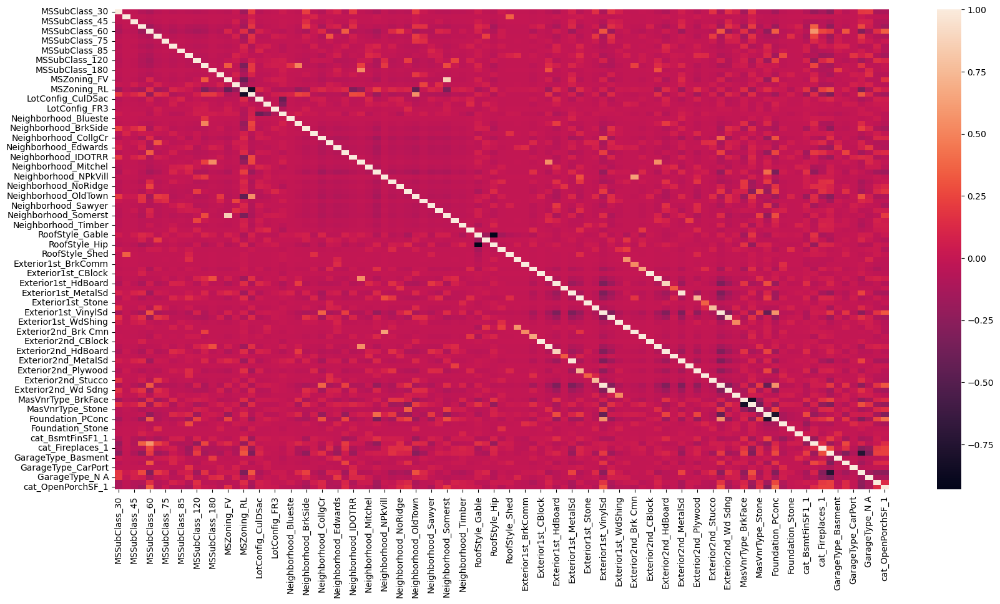

In [62]:
# Let's check the heatmap of dummy features created with one hot encoding to see the multicollinearity 
plt.figure(figsize=(20,10))
sns.heatmap(house_sales_dummies.corr())
plt.show()

### We can definitely see a strong multicollinearity just below the center towards righ side of the above heatmap. It's difficult to identify the features. Let's try to find multicollinear feature with their respective correlations.
#### Let's try to list out the features which have multicollinearity, with a correlation of more than 90%

In [63]:
# Method to find highly correlated features and return a data frame wuth the info
def find_highly_multicollinear_features(*, pDataFrame, pDependentFeature, pCorrelationValueToCheck):
    df_cols = ['Feature', 'High correlation with', f'Feature corr with {pDependentFeature}','Correlated with N features']
    df_high_multicollinear_features = pd.DataFrame(columns = df_cols)
    independent_features = list(pDataFrame.columns)
    corr_matrix = pDataFrame[independent_features].corr().round(2)
    
    for feature in independent_features:
        if pDependentFeature != feature :            
            highly_correlated_with = list()
            for k, v in corr_matrix[feature].to_dict().items() :
                if v >= pCorrelationValueToCheck and k != feature and k != pDependentFeature:
                    highly_correlated_with.append((k, v))
            if len(highly_correlated_with) > 0 :
                highly_correlated_with = sorted(highly_correlated_with, key = lambda x: x[1], reverse=False)
                df_high_multicollinear_features.loc[len(df_high_multicollinear_features.index)] = \
                (feature, highly_correlated_with,corr_matrix[feature][pDependentFeature],len(highly_correlated_with))
    return df_high_multicollinear_features.sort_values(by='Correlated with N features', ascending=False)



def calc_print_VIFvalue_stats(*, X):

    
    # Check VIF for Multicollinearity
    # VIF dataframe
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns

    # calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                              for i in range(len(X.columns))]

    vif_data.sort_values(by='VIF',ascending=False, inplace=True)
    return vif_data



### We can drop couple of features based on below factors,
1. Clearly seen multicollinearity by looking at heatmap and the correlations
2. Correlation of multicollinear features with dependent feature SalePrice
3. Which is the important feature when choosing between two feature
3. Carefully consideration about how houses are constructed along with the general knowledge about an house and the features in it


### Let's check the features which are having 90% correlation with other feature and remove the ones which will not provide value to business

In [64]:
temp_df = find_highly_multicollinear_features(pDataFrame = house_sales.select_dtypes(exclude='category'), pDependentFeature='SalePrice', pCorrelationValueToCheck = 0.60)
temp_df[temp_df['Correlated with N features']>2]

,Feature,High correlation with,Feature corr with SalePrice,Correlated with N features
0,OverallQual,"[(BsmtQual, 0.61), (KitchenQual, 0.65), (ExterQual, 0.71)]",0.81,3
3,ExterQual,"[(Foundation_PConc, 0.6), (KitchenQual, 0.7), (OverallQual, 0.71)]",0.69,3
13,KitchenQual,"[(YearRemodAdd, 0.62), (OverallQual, 0.65), (ExterQual, 0.7)]",0.66,3


In [65]:
house_sales.drop(columns = ['ExterQual','KitchenQual','YearBuilt'], inplace=True)


In [66]:

find_highly_multicollinear_features(pDataFrame = house_sales.select_dtypes(exclude='category'), pDependentFeature='SalePrice', pCorrelationValueToCheck = 0.60)

,Feature,High correlation with,Feature corr with SalePrice,Correlated with N features
10,TotRmsAbvGrd,"[(BedroomAbvGr, 0.69), (GrLivArea, 0.82)]",0.50,2
1,BsmtQual,"[(OverallQual, 0.61), (BsmtCond, 0.64)]",0.59,2
6,GrLivArea,"[(FullBath, 0.62), (TotRmsAbvGrd, 0.82)]",0.69,2
30,Exterior2nd_CmentBd,"[(Exterior1st_CemntBd, 0.98)]",0.13,1
23,Exterior1st_Plywood,"[(Exterior2nd_Plywood, 0.75)]",-0.01,1
24,Exterior1st_Stucco,"[(Exterior2nd_Stucco, 0.77)]",-0.02,1
25,Exterior1st_VinylSd,"[(Exterior2nd_VinylSd, 0.98)]",0.35,1
26,Exterior1st_Wd Sdng,"[(Exterior2nd_Wd Sdng, 0.86)]",-0.19,1
27,Exterior2nd_Brk Cmn,"[(Neighborhood_NPkVill, 0.63)]",-0.05,1
28,Exterior2nd_BrkFace,"[(Exterior1st_BrkFace, 0.66)]",0.01,1


In [67]:
house_sales.drop(columns = ['YearRemodAdd','GarageCond','Exterior2nd_CBlock','Exterior2nd_Plywood','Exterior2nd_CmentBd', \
                            'Exterior2nd_HdBoard', 'cat_Fireplaces_1','Exterior2nd_MetalSd','Exterior2nd_Wd Sdng',\
                            'Neighborhood_Somerst','cat_BsmtFinSF1_1','TotRmsAbvGrd','Exterior2nd_VinylSd',\
                            'Exterior2nd_Stucco','1stFlrSF','BsmtCond'], \
                             inplace=True)

In [68]:

df_VIF = calc_print_VIFvalue_stats(X=house_sales)
df_VIF.head(10)

,Feature,VIF
24,GarageQual,300.225474
20,Functional,176.742805
47,MSZoning_RL,158.181127
111,GarageType_Attchd,144.694387
76,RoofStyle_Gable,123.031283
9,BsmtQual,115.451362
8,ExterCond,101.630181
6,OverallQual,98.598502
16,GrLivArea,96.855591
19,KitchenAbvGr,81.217024


In [69]:
house_sales = pd.DataFrame(house_sales)
house_sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1418 entries, 0 to 1417
Columns: 119 entries, LotFrontage to cat_OpenPorchSF_1
dtypes: float64(1), int64(30), uint8(88)
memory usage: 476.4 KB


### Build a linear regression model

In [70]:
def residual_analysis_of_data(*,y, y_pred):
    # r2 score
    print('r2 score: ', round(r2_score(y, y_pred), 4))

    #Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
    residual = y - y_pred
    rss = np.sum(np.square(y - y_pred))
    print('rss :',round(rss , 4))
    mse = mean_squared_error(y, y_pred)
    print('mse :',round(mse , 4))
    # Root Mean Squared Error
    rmse = mse**0.5
    print('rmse :', round(rmse, 4))

    # Plot the Distribution of residual 
    sns.distplot(residual)
    plt.show()
    sns.scatterplot(y_pred, residual)
    plt.axhline(y=0, color='r', linestyle=':')
    plt.xlabel("Predictions")
    plt.ylabel("Residual")
    plt.show()

    # Plot the scatter plot of train data against prediction and show the regression line
    sns.scatterplot(x = y, y = y_pred)
    sns.regplot(x = y, y = y_pred ,ci=None, color ='green')
    plt.xlabel('Actual Data')
    plt.ylabel('Predicted')
    plt.show()
    # Q-Q plot to understand the distribution of residuals

    sm.qqplot(residual, line ='45', fit = True, dist = stats.norm)
    plt.show()  
    
    return residual
    

In [71]:
def build_linear_regression_model_and_display_stats_with_plots(*,X, y) -> LinearRegression :
    print('Traing data analysis')
    # Instantiate a LinearRegresssion model
    reg = LinearRegression() 

    # Fit the model
    reg.fit(X,y)

    # Predictions based of the model
    y_pred = reg.predict(X)

    residual = residual_analysis_of_data(y = y, y_pred = y_pred)

    return reg, residual

In [72]:
#Lets plot the residuals against some the numerical features, specially area features identified in the data set  
# Plot the Distribution of residual with training data
def plot_residuals_against_features(*,pFeatures : list, pDataFrame: pd.DataFrame, pResidual:list ):    
    for feature in pFeatures:
        if feature in pDataFrame.columns:
            sns.scatterplot(pDataFrame[feature], pResidual)
            plt.axhline(y=0, color='r', linestyle=':')
            plt.xlabel(feature)
            plt.ylabel("Residual")
            plt.show()

In [73]:

# Splitting data into train and test
def train_test_split_and_build_linear_model(*, pDataFrame: pd.DataFrame, pDependentFeature : str):
    df_train, df_test = train_test_split(pDataFrame, train_size = 0.7, random_state = 100)
    # Feature Scaling
    # We will use MinMax scaling for rescaling the continuous fetures

    # 1. Initialize the object 
    scaler = MinMaxScaler()

    # 2. Fit and transform train data
    features = df_train.columns
    df_train[features] = scaler.fit_transform(df_train[features])

    # 3. Only transform test data
    df_test[features] = scaler.transform(df_test[features])
    
    X = df_train.drop(columns = pDependentFeature).values.reshape(-1, len(df_train.drop(columns = pDependentFeature).columns))
    y = df_train[pDependentFeature].values.reshape(-1)
    ## Call function to build model and draw the plots for residula analysis
    print('Model results with training data\n')
    regression_model, residual = build_linear_regression_model_and_display_stats_with_plots(X = X, y = y)

    features_for_residual_analysis = ['SalePrice','LotArea','BsmtUnfSF','TotalBsmtSF','GrLivArea','YearBuilt_Minus_YearRemodAdd', 'YearSold_Minus_YearBuilt']
    plot_residuals_against_features(pFeatures = features_for_residual_analysis, pDataFrame = df_train, pResidual = residual)
    
    
    ## Validate against test data set
    print('\n\n\n Model results with test data')
    X_test = df_test.drop(columns = pDependentFeature).values.reshape(-1, len(df_test.drop(columns = pDependentFeature ).columns))
    y_test = df_test[pDependentFeature].values.reshape(-1)

    y_test_pred = regression_model.predict(X_test)
    residual_test = y_test - y_test_pred

    residual_analysis_of_data(y = y_test, y_pred = y_test_pred)

    plot_residuals_against_features(pFeatures = features_for_residual_analysis, pDataFrame = df_test, pResidual = residual_test)

Model results with training data

Traing data analysis
r2 score:  0.9026
rss : 2.9383
mse : 0.003
rmse : 0.0544


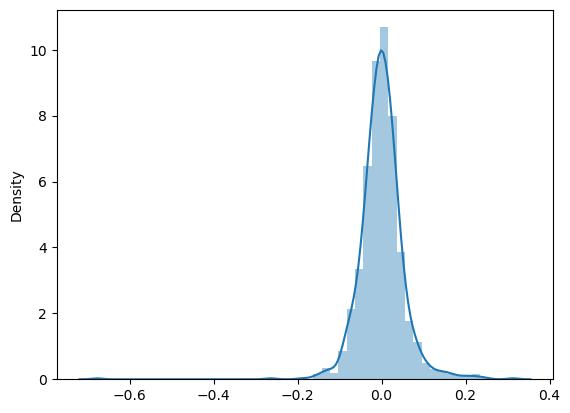

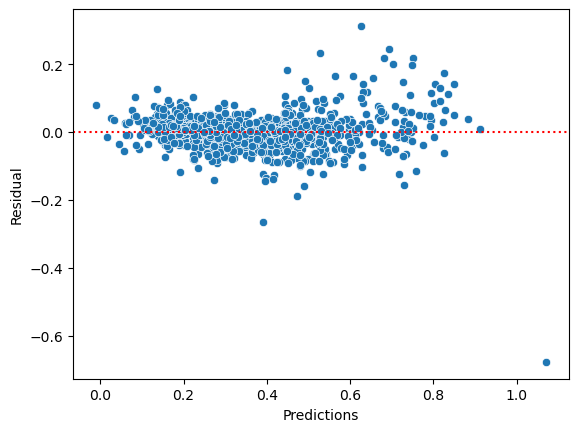

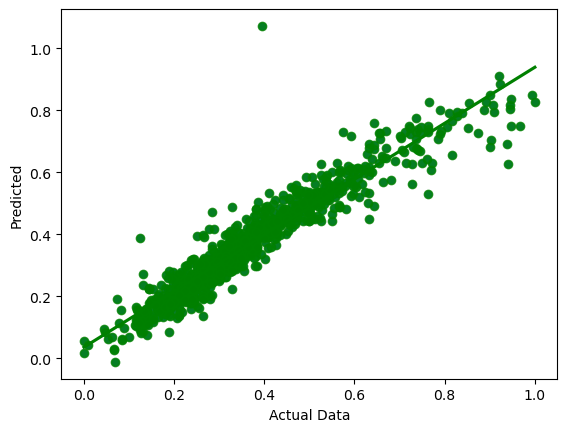

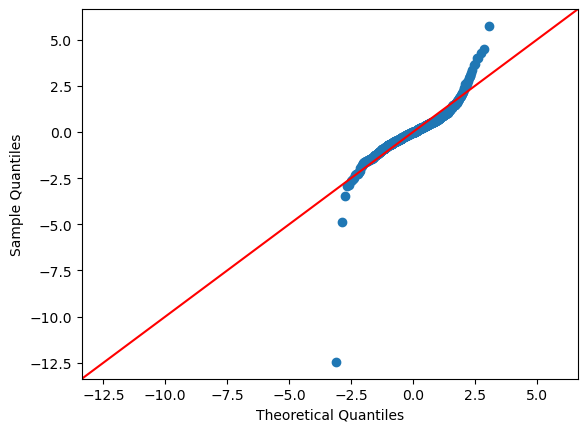

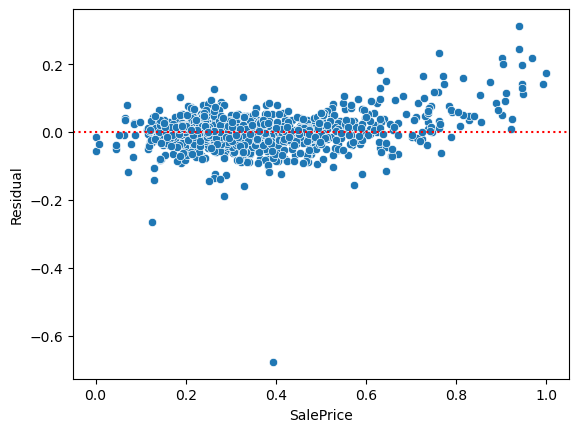

...

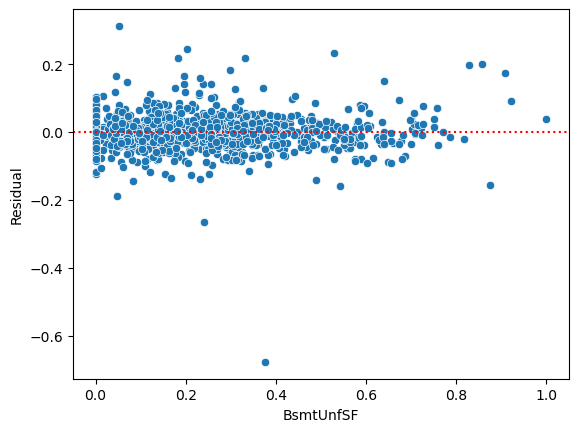

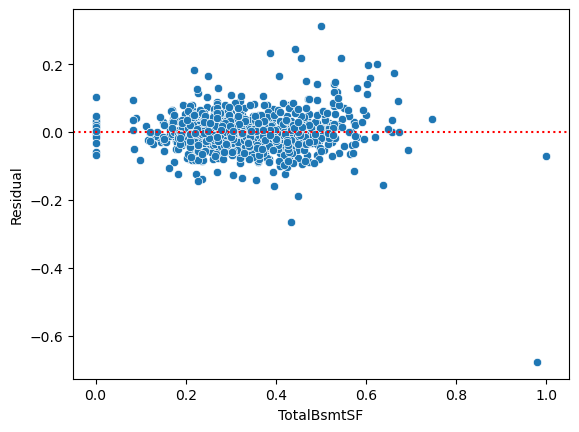

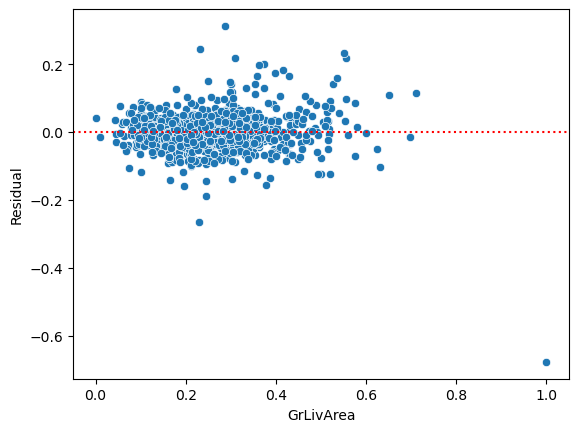

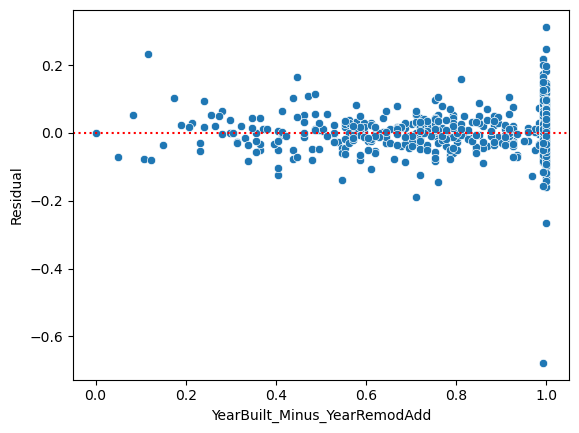

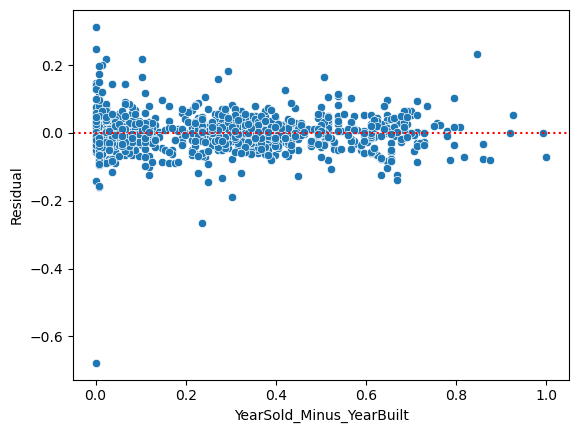




 Model results with test data
r2 score:  0.8734
rss : 1.7299
mse : 0.0041
rmse : 0.0637


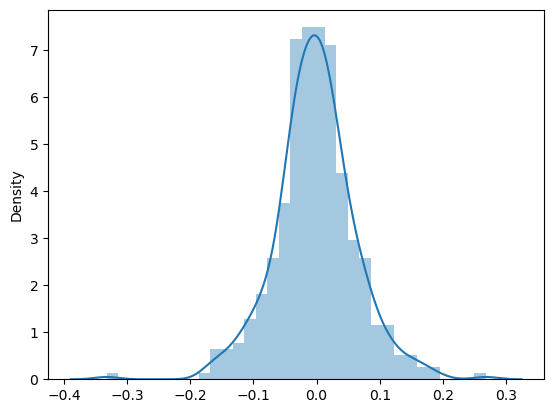

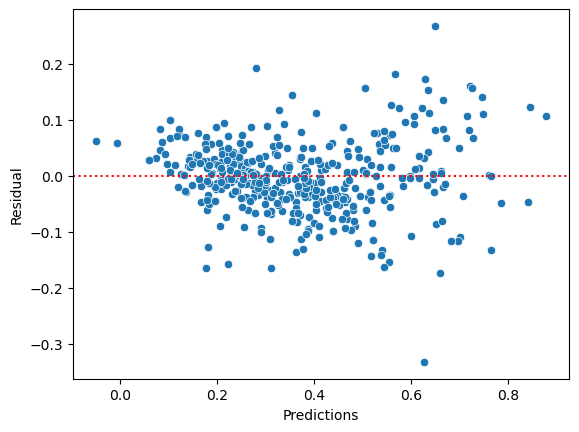

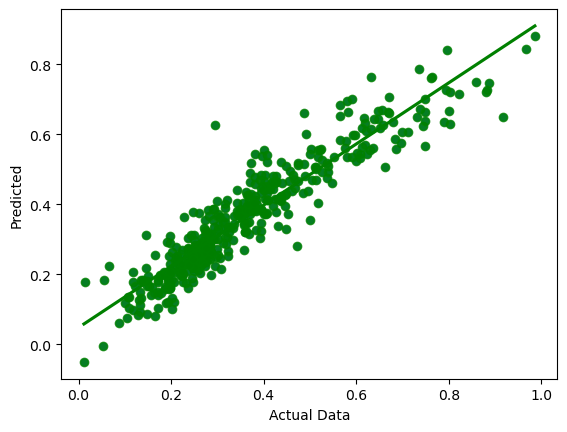

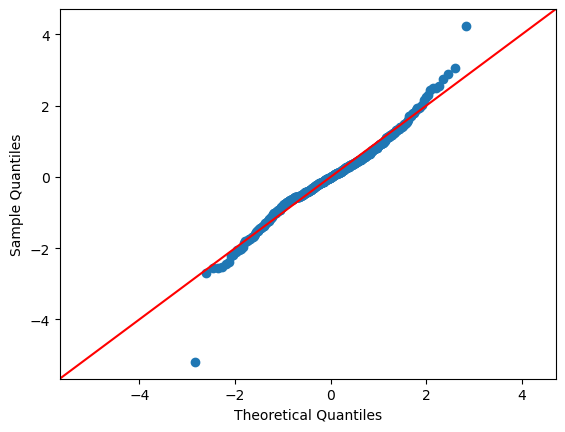

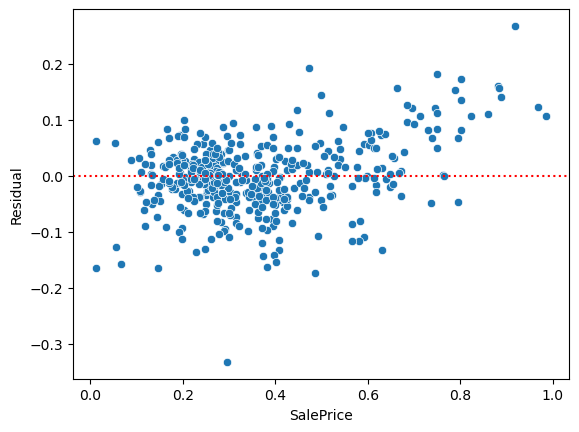

...

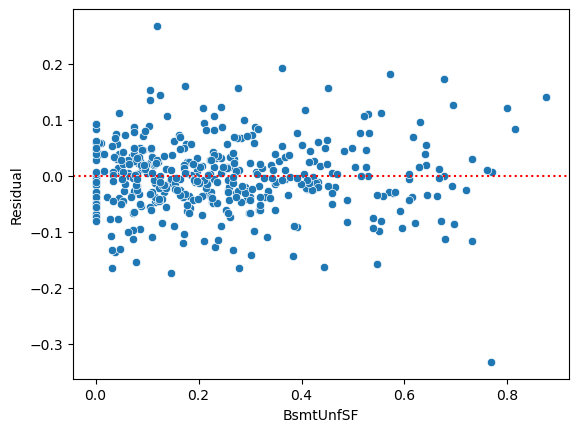

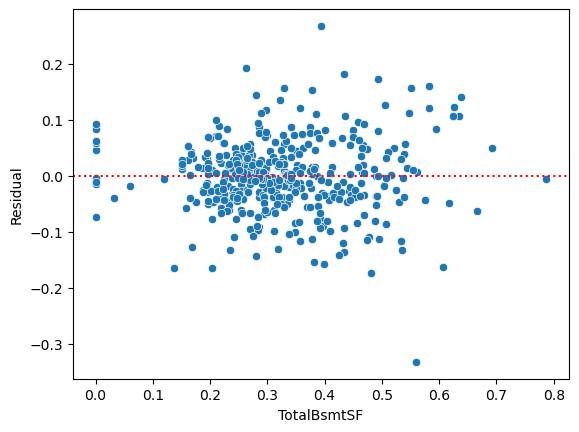

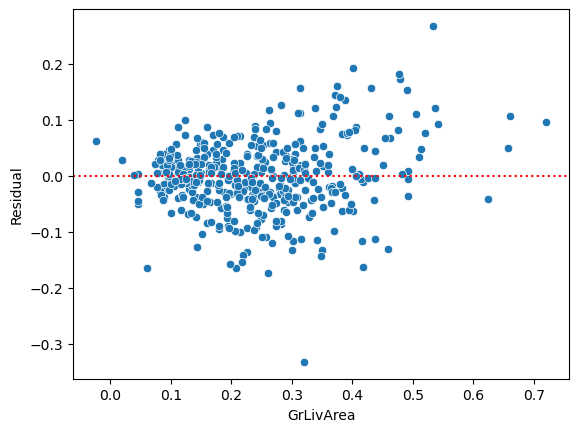

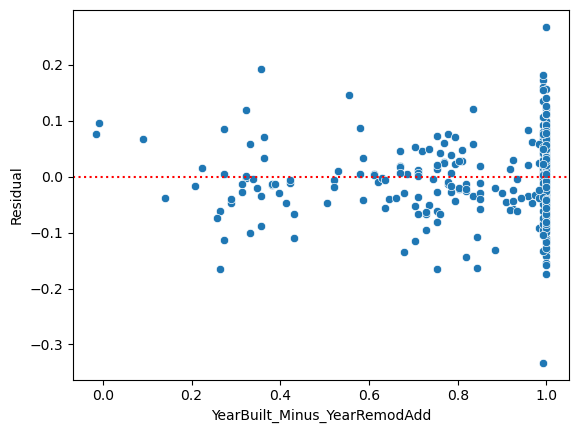

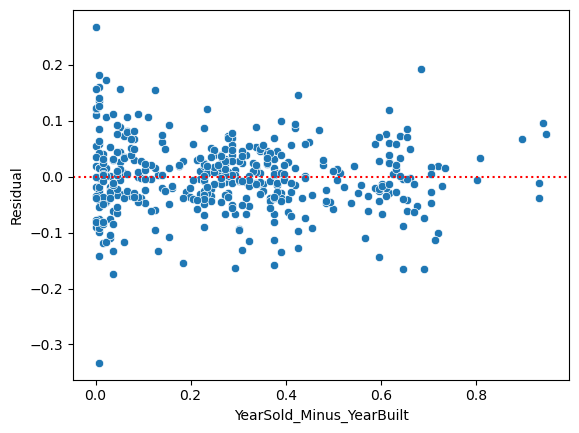

In [74]:
# Build model and analyze
train_test_split_and_build_linear_model(pDataFrame = house_sales, pDependentFeature = 'SalePrice')

### We can see that the linear model built is performing well with training as well as test data set. 

#### Model results with training data<br>

Traing data analysis<br>
r2 score:  0.9026<br>
rss : 3.32<br>
mse : 0.0<br>
rmse : 0.05<br>

#### Model results with test data<br>
r2 score:  0.8734<br>
rss : 1.21<br>
mse : 0.0<br>
rmse : 0.07<br>


### Residuals are normally distributed, but we can see a trend a rising trend in the SalePrice
### Let's check the distribution of Sale price with data transformation

In [75]:
def check_distribution_Of_feature_with_transformation(*,pDataOfAFeature : pd.DataFrame  ):
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, sharey=False,figsize=(20,5))
    plt.subplots_adjust(top = 1, bottom=0.01, hspace=0.01, wspace=0.4)
    sns.distplot(pDataOfAFeature, ax=ax1)
    ax1.title.set_text('Without transformation')         
    log_transformation = np.log(pDataOfAFeature)
    sns.distplot(log_transformation, ax=ax2)
    ax2.title.set_text('Log transformation')
    sns.distplot(boxcox(pDataOfAFeature)[0] ,ax=ax5)   
    ax5.title.set_text('boxcox transformation')
    sqrt_transformation = np.sqrt(pDataOfAFeature)
    sns.distplot(sqrt_transformation, ax=ax3)
    ax3.title.set_text('sqrt transformation')
    cbrt_transformation = np.cbrt(pDataOfAFeature)
    sns.distplot(cbrt_transformation, ax=ax4)
    ax4.title.set_text('cbrt transformation')
    plt.show()

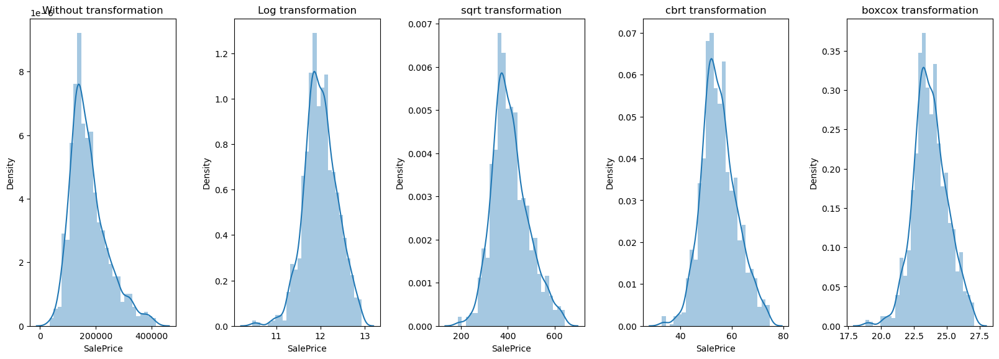

In [76]:
check_distribution_Of_feature_with_transformation(pDataOfAFeature=house_sales.SalePrice)

### Log data transformation of SalePrice is showing a pretty good normal distribution. Let's do the log transformation and check the linear regression model

Model results with training data

Traing data analysis
r2 score:  0.9118
rss : 1.9682
mse : 0.002
rmse : 0.0445


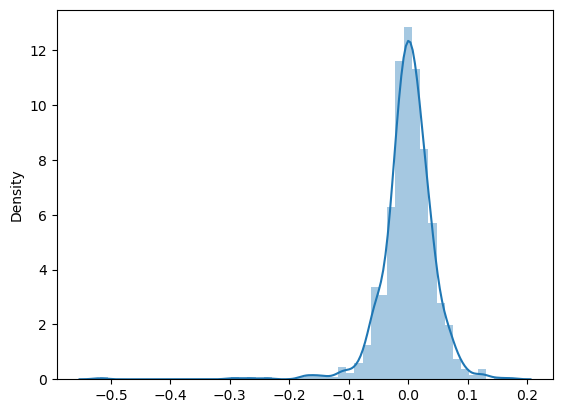

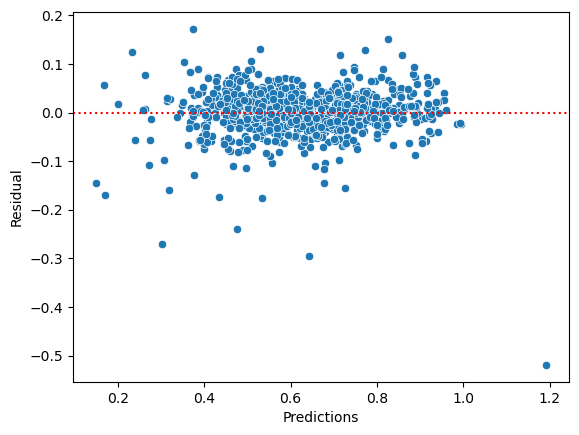

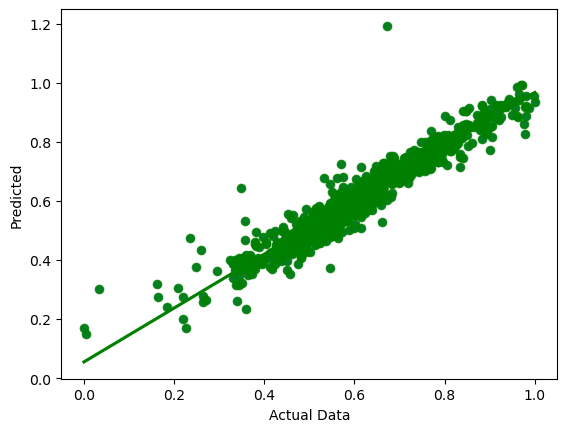

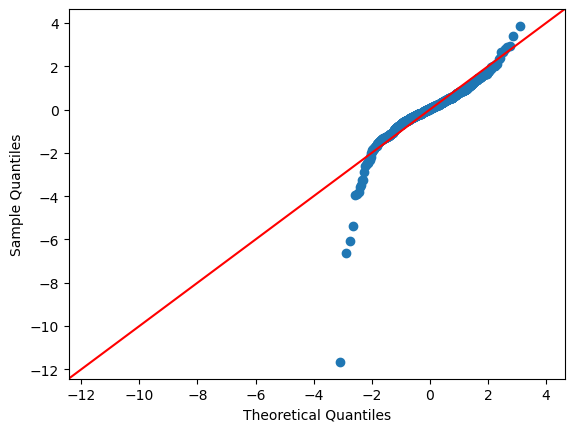

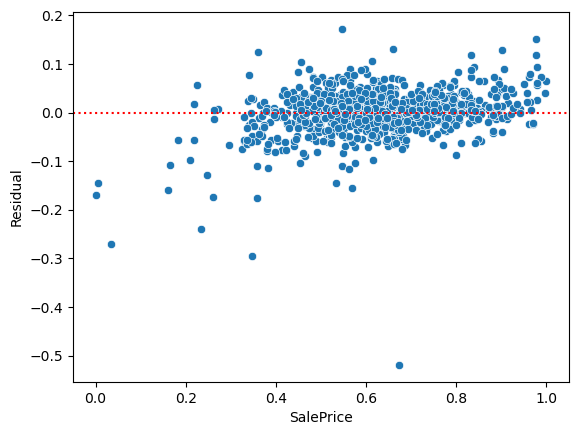

...

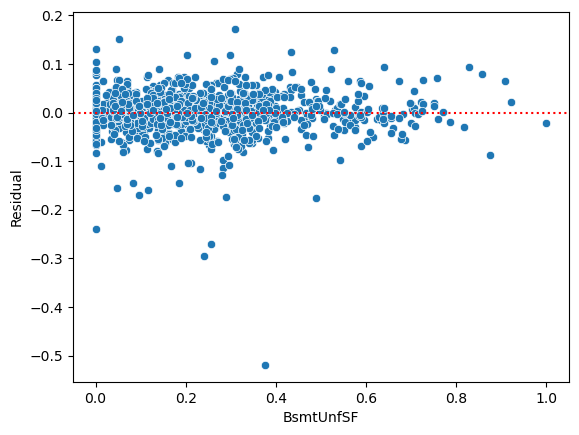

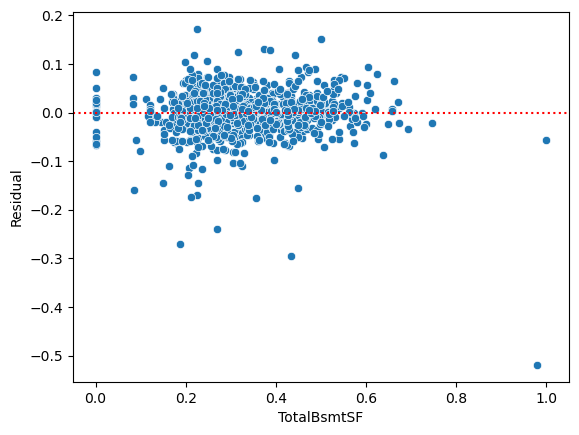

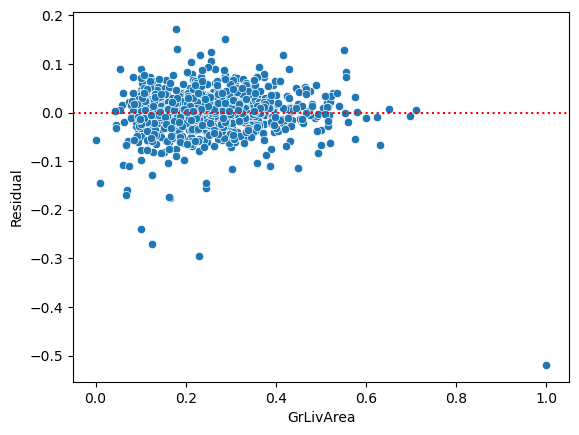

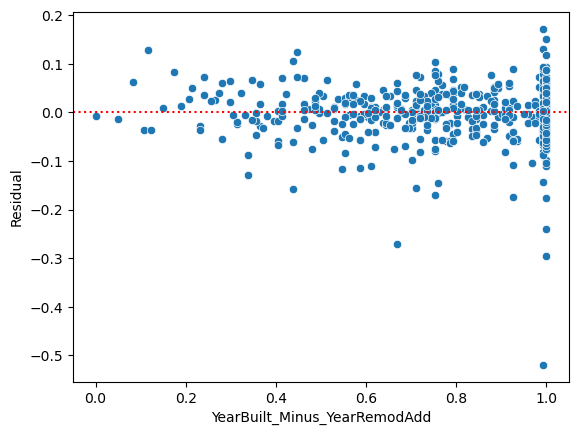

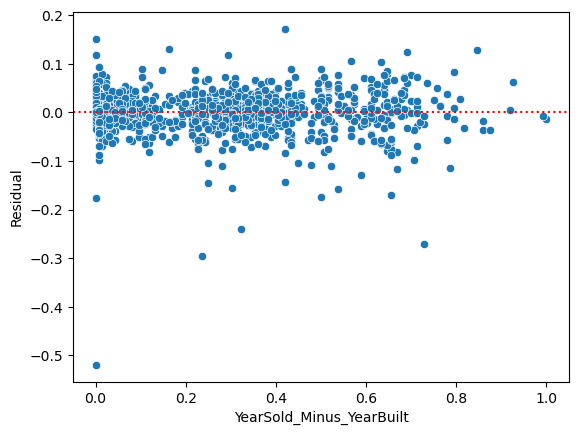




 Model results with test data
r2 score:  0.8931
rss : 1.1096
mse : 0.0026
rmse : 0.051


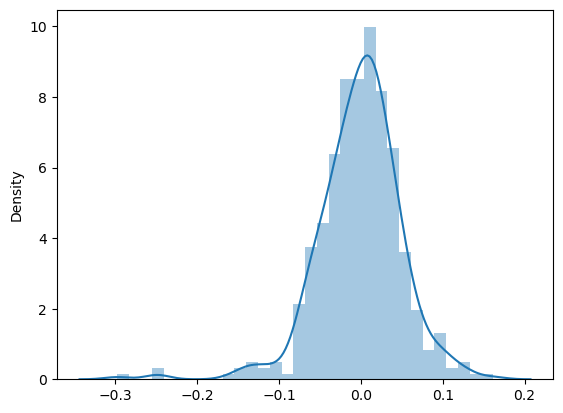

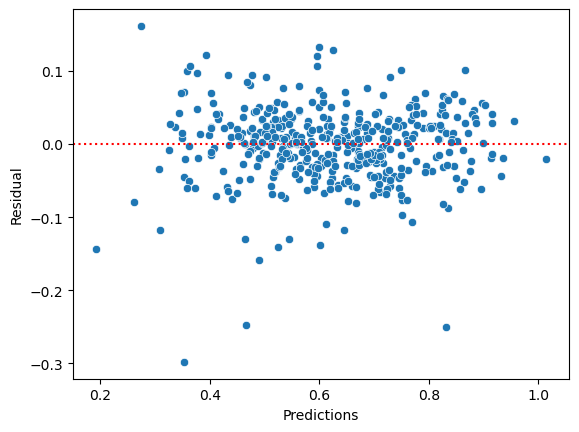

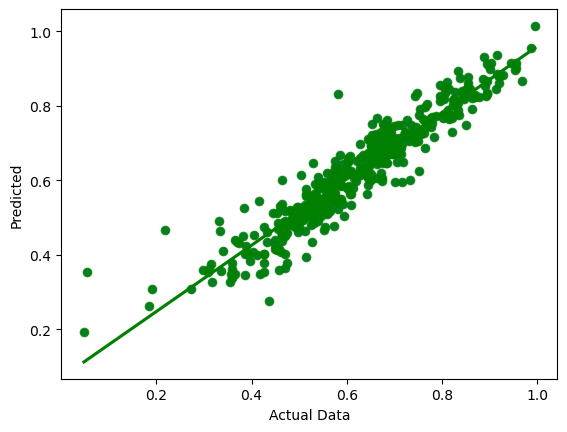

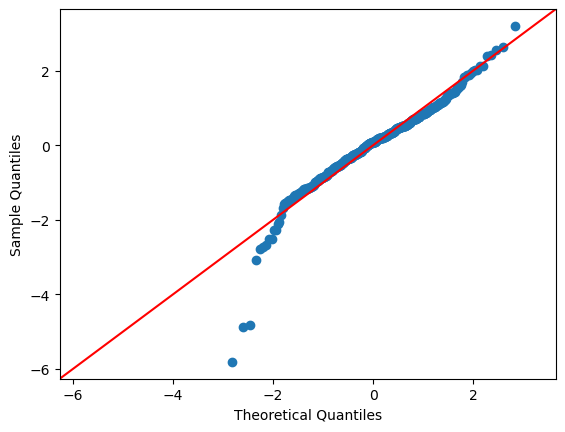

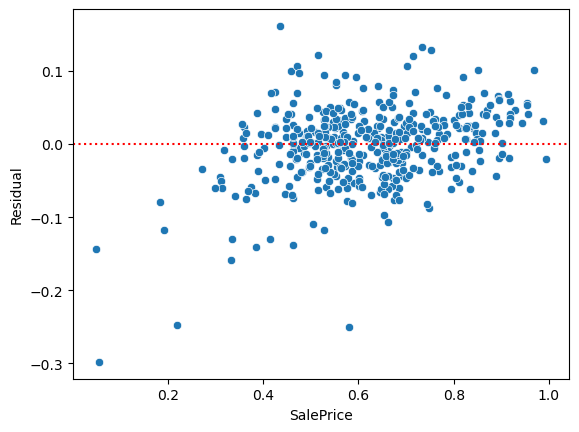

...

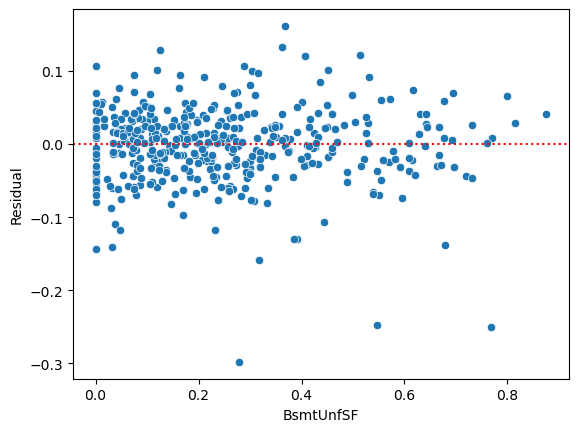

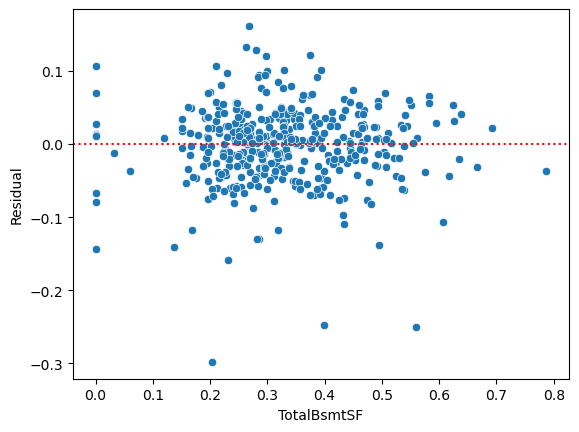

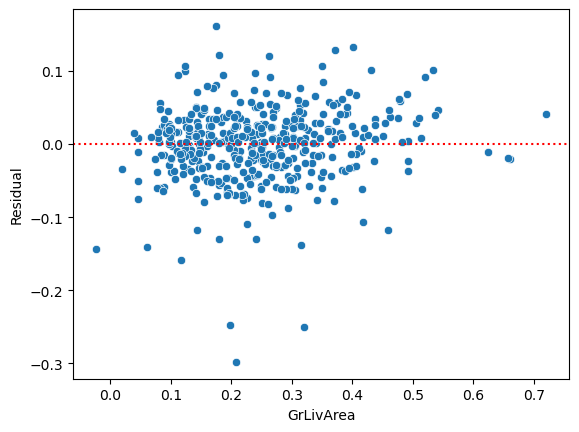

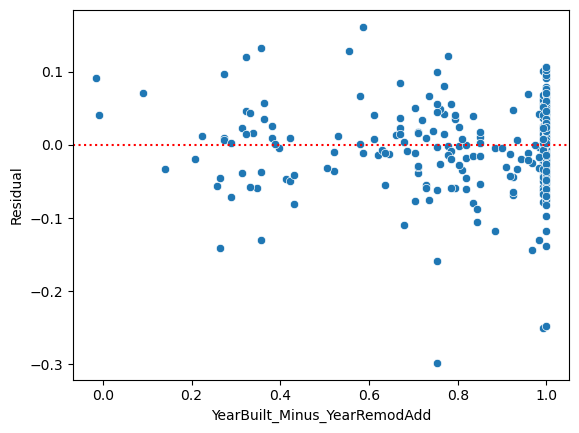

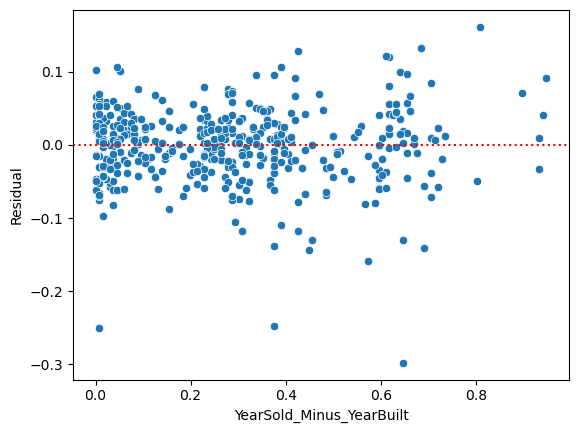

In [77]:
# Log transformation of SalePrice
house_sales.SalePrice = np.log(house_sales.SalePrice)
# Build model and analyze
train_test_split_and_build_linear_model(pDataFrame = house_sales, pDependentFeature = 'SalePrice')

### We do not see much difference in accuracy of the model but the slight trend in residual is removed, which was becase of SalePrice. Now the residuals are normally distrubuted and the error terms have pretty constant variance.

### <font color='blue'> Let's build a Ridge Regression model with the log trasformation SalePrice and find the hyperparameter 'lambda'</font>

In [78]:
# Check the data to make sure it's not scaled yet
house_sales.head(5)

,LotFrontage,LotArea,LotShape,LandContour,LandSlope,HouseStyle,OverallQual,OverallCond,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,Functional,FireplaceQu,GarageFinish,GarageCars,GarageQual,PavedDrive,Fence,MoSold,SalePrice,YearBuilt_Minus_YearRemodAdd,YearSold_Minus_YearBuilt,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Stone,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,cat_2ndFlrSF_1,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_N A,cat_WoodDeckSF_1,cat_OpenPorchSF_1
0,65.0,8450,4,4,1,4,7,5,3,5,2,7,2,150,856,5,1710,2,3,1,8,1,3,2,4,3,1,2,12.247694,0,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1
1,80.0,9600,4,4,1,1,6,8,3,5,5,6,2,284,1262,5,1262,2,3,1,8,4,3,2,4,3,1,5,12.109011,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
2,68.0,11250,3,4,1,4,7,5,3,5,3,7,2,434,920,5,1786,2,3,1,8,4,3,2,4,3,1,9,12.317167,-1,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1
3,60.0,9550,3,4,1,4,7,5,3,4,2,6,2,540,756,4,1717,1,3,1,8,5,2,3,4,3,1,2,11.849398,-55,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1
4,84.0,14260,3,4,1,4,8,5,3,5,4,7,2,490,1145,5,2198,2,4,1,8,4,3,3,4,3,1,12,12.429216,0,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,1


In [79]:
# Let's Scale the data using MinMaxScaler to bring all feature into one scale
scaler = MinMaxScaler()
all_features = house_sales.columns
house_sales[all_features] = scaler.fit_transform(house_sales[all_features])
house_sales.head()

,LotFrontage,LotArea,LotShape,LandContour,LandSlope,HouseStyle,OverallQual,OverallCond,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,Functional,FireplaceQu,GarageFinish,GarageCars,GarageQual,PavedDrive,Fence,MoSold,SalePrice,YearBuilt_Minus_YearRemodAdd,YearSold_Minus_YearBuilt,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Stone,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,cat_2ndFlrSF_1,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_N A,cat_WoodDeckSF_1,cat_OpenPorchSF_1
0,0.150685,0.184307,1.000000,1.0,0.0,0.428571,0.666667,0.500,0.5,0.8,0.25,1.000000,0.166667,0.064212,0.266999,1.00,0.316905,0.666667,0.375,0.333333,1.0,0.0,0.666667,0.50,0.6,1.0,0.0,0.090909,0.721763,1.000000,0.036765,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.202055,0.213951,1.000000,1.0,0.0,0.000000,0.555556,0.875,0.5,0.8,1.00,0.833333,0.166667,0.121575,0.393637,1.00,0.213726,0.666667,0.375,0.333333,1.0,0.6,0.666667,0.50,0.6,1.0,0.0,0.363636,0.665763,1.000000,0.227941,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.160959,0.256483,0.666667,1.0,0.0,0.428571,0.666667,0.500,0.5,0.8,0.50,1.000000,0.166667,0.185788,0.286962,1.00,0.334408,0.666667,0.375,0.333333,1.0,0.6,0.666667,0.50,0.6,1.0,0.0,0.727273,0.749815,0.991870,0.051471,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.133562,0.212662,0.666667,1.0,0.0,0.428571,0.666667,0.500,0.5,0.6,0.25,0.833333,0.166667,0.231164,0.235808,0.75,0.318517,0.333333,0.375,0.333333,1.0,0.8,0.333333,0.75,0.6,1.0,0.0,0.090909,0.560933,0.552846,0.669118,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,

In [80]:
# Let's find optimum value of lambda, not being too high to avoid underfitting, not being too low to avoid overfitting
def find_optimal_lambda_using_grid_search_cross_validation(*, pRidgeOrLassoModel, pDataFrame : pd.DataFrame, pDependentFeature: str):
    
    lambdas_values_to_choose = {'alpha': [0.00001,0.0001, 0.001, 0.01, 0.05, 0.1, 0.15, 0.2,0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0,
                                          3.0, 4.0, 4.5, 5.0, 5.5, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 200, 300, 400, 500, 1000 ]}
    
    # cross validation
    cross_validation_folds = 5
    model_cross_validation = GridSearchCV(estimator = pRidgeOrLassoModel,param_grid = lambdas_values_to_choose,\
                                           scoring= 'neg_mean_absolute_error', cv = cross_validation_folds,\
                                           return_train_score= True, verbose = 1)

    X = pDataFrame.drop(columns = pDependentFeature)
    y = pDataFrame[pDependentFeature]
    model_cross_validation.fit(X, y)

    print('Best value of lambda is :', model_cross_validation.best_params_)
    print('Best neg_mean_absolute_error', model_cross_validation.best_score_)

In [81]:
# Find optimal value of lambda for Ridge regression
find_optimal_lambda_using_grid_search_cross_validation(pRidgeOrLassoModel = Ridge(), pDataFrame = house_sales, pDependentFeature='SalePrice' )

Fitting 5 folds for each of 38 candidates, totalling 190 fits
Best value of lambda is : {'alpha': 0.25}
Best neg_mean_absolute_error -0.03375552664425553


In [82]:
# train test split
df_train, df_test = train_test_split(house_sales, train_size = 0.7, random_state = 100)

X_train = df_train.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_train = df_train['SalePrice'].values.reshape(-1)

X_test = df_test.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_test = df_test['SalePrice'].values.reshape(-1)

coef 
 [ 2.61687489e-02  4.15202324e-02  5.11010306e-03  7.82529073e-04
 -9.28819375e-03  3.31362523e-03  1.71969373e-01  1.32850437e-01
 -3.54908996e-02  4.55462242e-02  2.24224461e-02  1.37821922e-02
 -7.72315874e-03 -5.79022307e-02  1.68679478e-01  2.48375669e-02
  3.25436438e-01  8.36226648e-03  2.64563647e-02 -2.62636050e-02
  2.21444736e-02  3.11556679e-02  4.01985403e-03  8.96051054e-02
  7.74858434e-02  8.86621651e-04 -9.95652307e-04 -4.72952210e-03
 -6.21422590e-02 -1.62143441e-01 -3.38154765e-02  5.10289374e-02
 -5.74001418e-03  5.84448160e-03 -4.19999550e-03  1.85782445e-02
  4.07120066e-03 -3.18308485e-03 -1.76949203e-02  5.54217905e-03
 -3.03321523e-02 -6.44636316e-02 -3.53240769e-02  1.79339929e-04
  1.37728834e-01  1.06222778e-01  1.12556533e-01  9.69117863e-02
  8.97485390e-03 -1.49234481e-02 -3.83188003e-02 -8.61388952e-03
 -1.59581700e-02 -8.56584929e-03 -5.03555211e-03  1.10925553e-02
 -2.20315767e-02  4.25052929e-02 -3.93588887e-02 -2.02652242e-02
 -3.22996195e-02 -

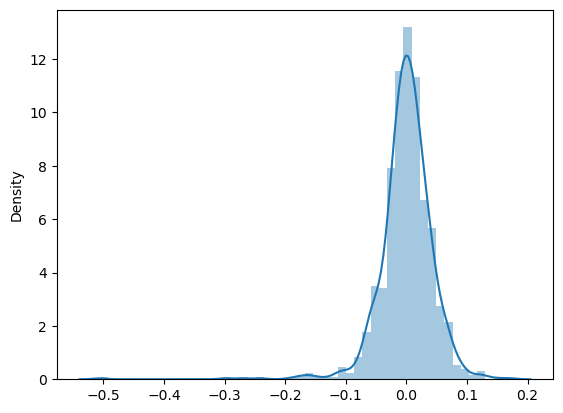

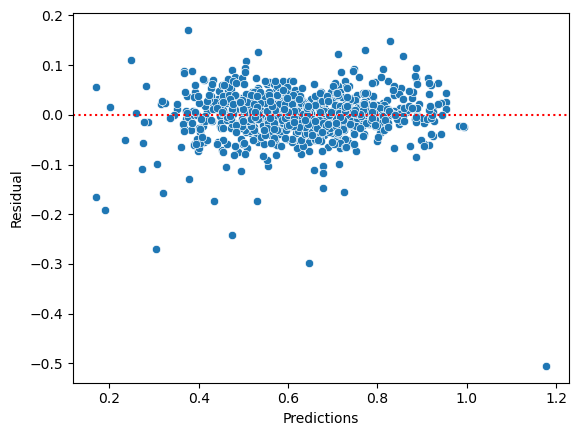

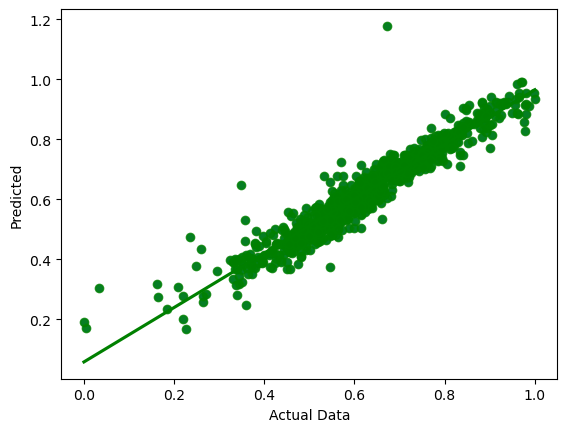

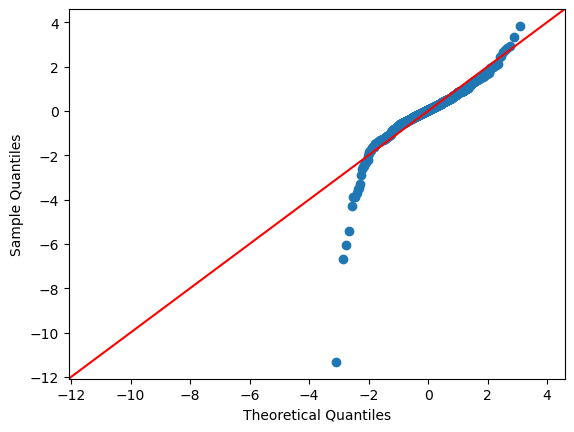

r2 score with test data set 0.8921
Residual Analysis of test data
r2 score:  0.8921
rss : 1.1192
mse : 0.0026
rmse : 0.0513


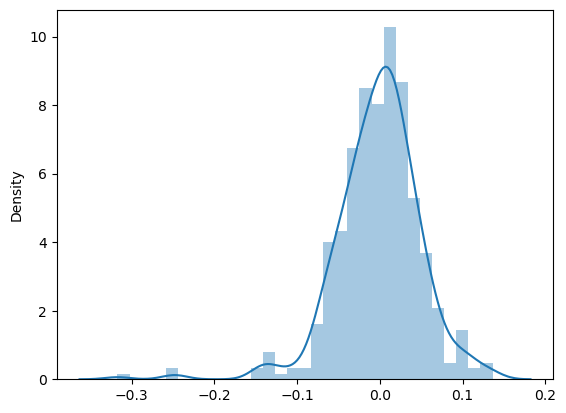

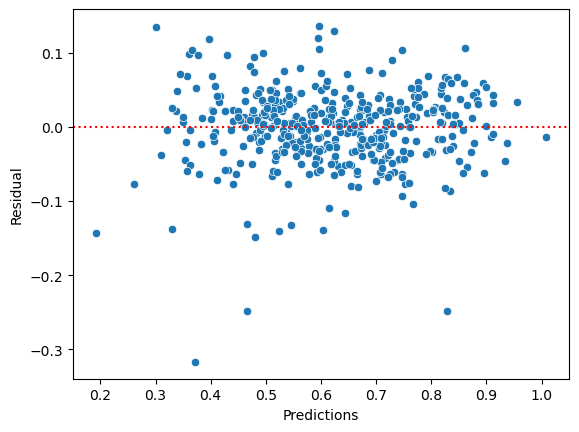

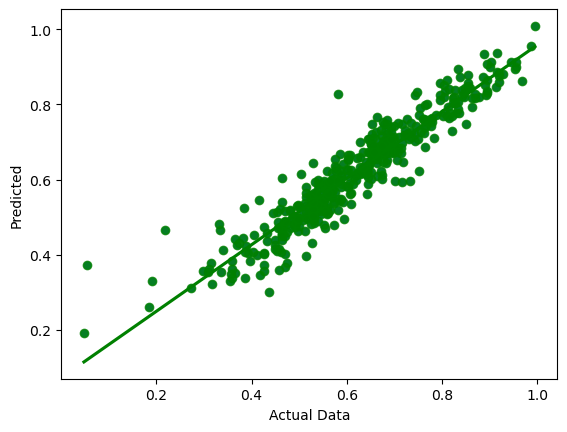

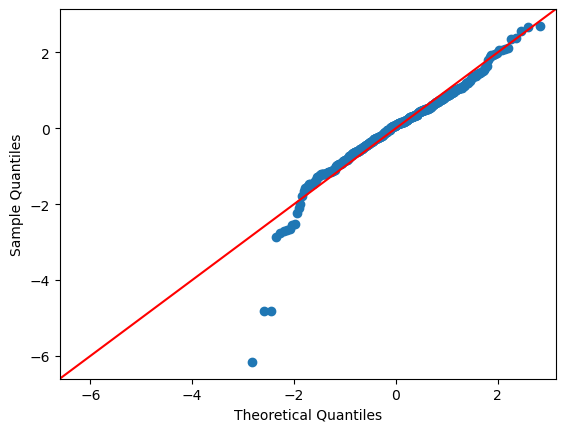

In [83]:
# Let's use the best lamda value found and build regression model model_cross_validation

alpha = 0.25
ridge_model = Ridge (alpha=alpha)
ridge_model.fit(X_train, y_train) 
print ("coef \n", ridge_model.coef_, '\n\n')

y_pred_train = ridge_model.predict(X_train)
print ("r2 score with training data set", round(r2_score(y_true = y_train, y_pred = y_pred_train), 4))
print('Residual Analysis of train data')
residual = residual_analysis_of_data(y=y_train, y_pred=y_pred_train)
y_pred_test = ridge_model.predict(X_test)
print ("r2 score with test data set", round(r2_score(y_true = y_test, y_pred = y_pred_test), 4))
print('Residual Analysis of test data')
residual = residual_analysis_of_data(y=y_test, y_pred=y_pred_test)

### The Ridge model built with the lambda value 0.25, is showing an accuracy of 91% with training data and 89% with test data. The accuracy is pretty good, the difference between test and train data accuracy is withing 5%. 

## Residuals are normally distrubuted and the error terms have constant variance.¶

### <font color='blue'> Let's build a Lasso Regression model with the log trasformationed SalePrice and find the hyperparameter 'lambda'</font>

In [84]:
# Find the optimum lambda value for Lasso regression
find_optimal_lambda_using_grid_search_cross_validation(pRidgeOrLassoModel = Lasso(), pDataFrame = house_sales, pDependentFeature = 'SalePrice')

Fitting 5 folds for each of 38 candidates, totalling 190 fits
Best value of lambda is : {'alpha': 0.0001}
Best neg_mean_absolute_error -0.03344365987649742


coef 
 [ 5.48495146e-03  2.80162334e-02  3.90622161e-05  0.00000000e+00
 -0.00000000e+00 -2.61907447e-03  1.97056215e-01  1.40786355e-01
 -1.31650277e-02  3.30771658e-02  2.19345059e-02  1.56485682e-02
 -0.00000000e+00 -4.74081704e-02  1.58583445e-01  2.20388249e-02
  3.55247733e-01  4.15210397e-03  7.19197103e-03 -0.00000000e+00
  1.39327618e-02  3.33300346e-02  0.00000000e+00  8.62041048e-02
  2.90833707e-02  0.00000000e+00 -3.00194945e-03 -4.33647794e-03
 -4.87838374e-02 -1.57123606e-01 -3.50548680e-02  0.00000000e+00
 -0.00000000e+00  1.07724829e-03 -0.00000000e+00  1.24589705e-02
  0.00000000e+00  0.00000000e+00 -3.25585804e-03  0.00000000e+00
 -2.52591723e-02 -5.49743161e-02 -1.37550713e-02 -0.00000000e+00
  8.10271089e-02  4.15687543e-02  5.01168351e-02  2.71396906e-02
  6.67163823e-03 -7.74927244e-03 -0.00000000e+00 -6.76800459e-03
 -0.00000000e+00 -0.00000000e+00  7.38959263e-03  1.87010789e-02
 -8.69830576e-03  4.91920041e-02 -2.19764937e-02 -7.67672010e-03
 -2.12114289e-02 -

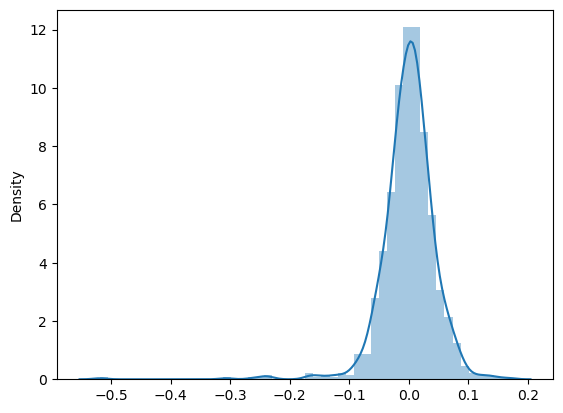

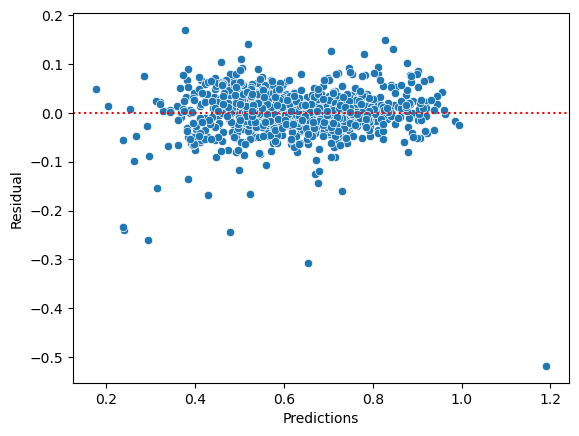

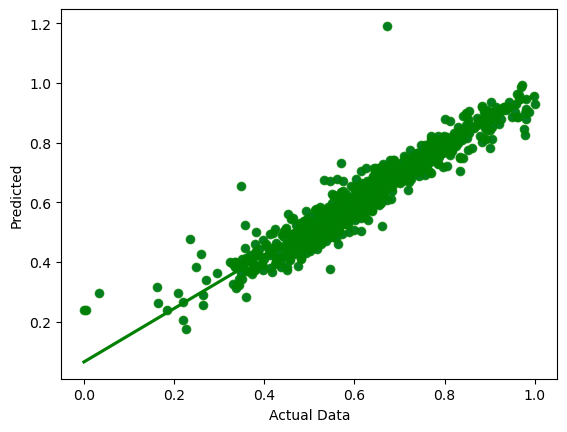

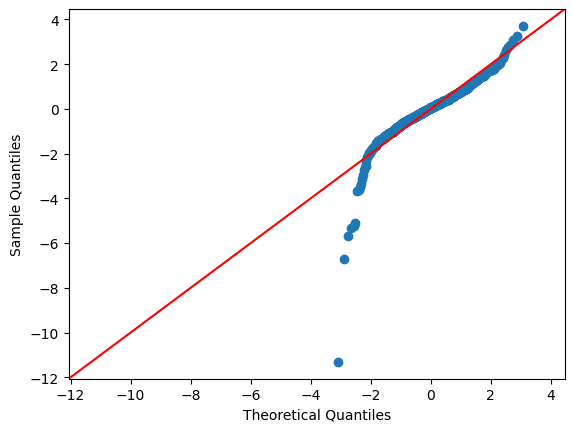

Residual Analysis of test data
r2 score:  0.8931
rss : 1.1087
mse : 0.0026
rmse : 0.051


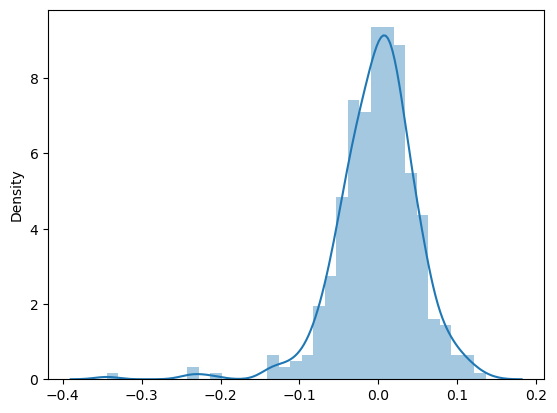

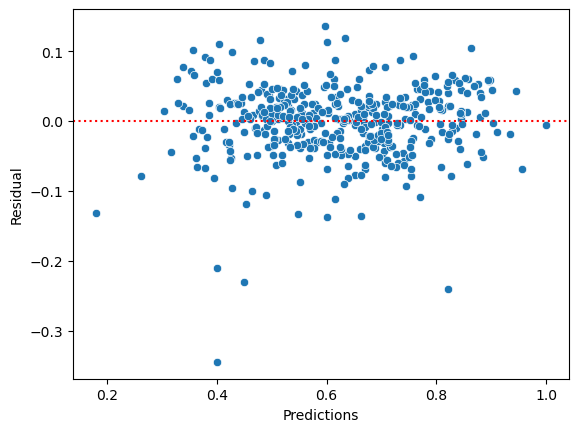

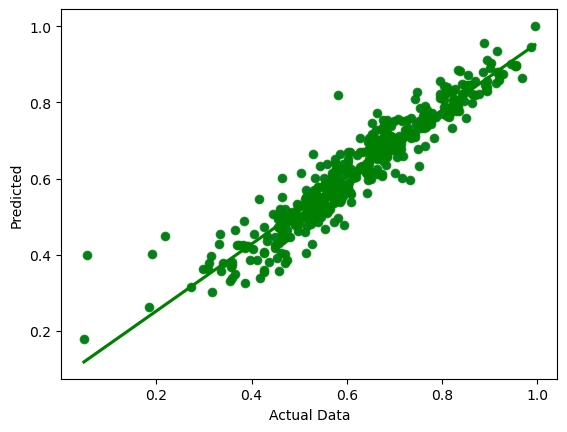

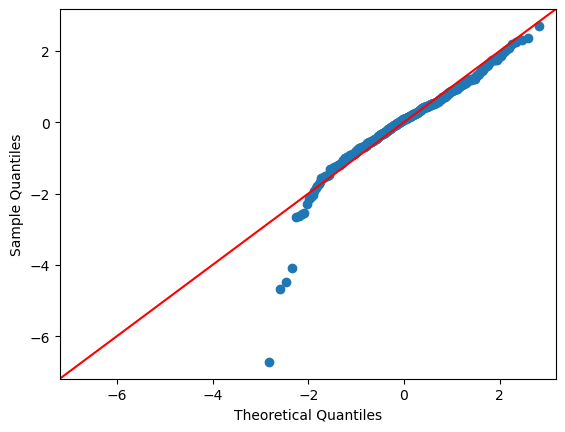

In [85]:
# Let's use the best lamda value found and build regression model model_cross_validation

alpha = 0.0001
lasso_model = Lasso(alpha = alpha)
lasso_model.fit(X_train, y_train) 
print ("coef \n", lasso_model.coef_, '\n\n')

y_pred_train = lasso_model.predict(X_train)
print ("r2 score with training data set", round(r2_score(y_true = y_train, y_pred = y_pred_train), 4))
y_pred_test = lasso_model.predict(X_test)
print ("r2 score with test data set", round(r2_score(y_true = y_test, y_pred = y_pred_test), 4))
print('Residual Analysis of train data')
residual = residual_analysis_of_data(y=y_train, y_pred=y_pred_train)
print('Residual Analysis of test data')
residual = residual_analysis_of_data(y=y_test, y_pred=y_pred_test)

## Lasso model has a good accuracy and residuals are normally distrubuted. The error terms have constant variance.

## <font color = 'green'>  Here is the accuracy of the models, </font>
###  1. Ridge regression with hyperparameter lambda value 0.25<br>
        r2 score with training data set 0.9115 
        
        r2 score with test data set 0.8921
###  2. Lasso regression with hyperparameter lambda value 0.0001<br>
        r2 score with training data set 0.9067 
        
        r2 score with test data set 0.8931  

In [86]:
# Let's check the betas of Ridge and Lasso model
df_coef = pd.DataFrame(index= house_sales.drop(columns='SalePrice').columns)
df_coef['Ridge'] = ridge_model.coef_
df_coef['Lasso'] = lasso_model.coef_

df_coef.sort_values(by='Lasso')

,Ridge,Lasso
YearSold_Minus_YearBuilt,-0.162143,-0.157124
MSSubClass_160,-0.064464,-0.054974
YearBuilt_Minus_YearRemodAdd,-0.062142,-0.048784
BsmtUnfSF,-0.057902,-0.047408
MSSubClass_30,-0.033815,-0.035055
MSSubClass_120,-0.030332,-0.025259
Neighborhood_Edwards,-0.039359,-0.021976
Neighborhood_IDOTRR,-0.032300,-0.021211
Neighborhood_Mitchel,-0.035719,-0.019040
Neighborhood_MeadowV,-0.035242,-0.015105


In [87]:
# Select top 5 features from Lasso regression model
df_coef['Absolute coef of Lasso'] = abs(df_coef.Lasso)
df_coef = df_coef.sort_values(by = ['Absolute coef of Lasso'], ascending = False)
df_coef[:5]


,Ridge,Lasso,Absolute coef of Lasso
GrLivArea,0.325436,0.355248,0.355248
OverallQual,0.171969,0.197056,0.197056
TotalBsmtSF,0.168679,0.158583,0.158583
YearSold_Minus_YearBuilt,-0.162143,-0.157124,0.157124
OverallCond,0.132850,0.140786,0.140786


### <font color='green'> Below are the top 5 features in order, we could recommed to customer to use while making decision about buying a house. These variable are significant in predicting the price of a house,</font>
1. GrLivArea
2. OverallQual
3. TotalBsmtSF
4. YearSold_Minus_YearBuilt : Age the house at the time it was sold
5. OverallCond

### Let's find the next top 5 features using Lasso regression, if we decide to exclude top 5 feature identified as significant variable

In [88]:
house_sales_with_top5_predictors_removed = house_sales.drop(columns=['GrLivArea','OverallQual','TotalBsmtSF','YearSold_Minus_YearBuilt','OverallCond'])

find_optimal_lambda_using_grid_search_cross_validation(pRidgeOrLassoModel = Lasso(), 
                                                       pDataFrame = house_sales_with_top5_predictors_removed,
                                                       pDependentFeature = 'SalePrice')

Fitting 5 folds for each of 38 candidates, totalling 190 fits
Best value of lambda is : {'alpha': 0.0001}
Best neg_mean_absolute_error -0.04535673276797454


In [89]:
# Let's use the best lamda value found and build regression model model_cross_validation
# train test split
df_train, df_test = train_test_split(house_sales_with_top5_predictors_removed, train_size = 0.7, random_state = 100)

X_train = df_train.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_train = df_train['SalePrice'].values.reshape(-1)

X_test = df_test.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_test = df_test['SalePrice'].values.reshape(-1)

#  Lasso regression
alpha = 0.0001
lasso_model = Lasso(alpha = alpha)
lasso_model.fit(X_train, y_train) 
print ("coef \n", lasso_model.coef_, '\n\n')

y_pred_train = lasso_model.predict(X_train)
print ("r2 score with training data set", round(r2_score(y_true = y_train, y_pred = y_pred_train), 4))

y_pred_test = lasso_model.predict(X_test)
print ("r2 score with test data set", round(r2_score(y_true = y_test, y_pred = y_pred_test), 4))

coef 
 [ 0.02113784  0.09904183 -0.          0.         -0.00512959 -0.01119672
  0.00767549  0.13582754  0.04238141  0.04462535  0.          0.01550623
  0.05358081  0.08598054  0.09010617 -0.01314497  0.00463384  0.06144688
  0.01895349  0.13955649  0.0691209   0.00907499  0.00245413  0.
 -0.08061468 -0.07711627  0.031872   -0.         -0.00637357  0.00387395
  0.01110884  0.         -0.         -0.01580283  0.01628665 -0.0336637
 -0.04808748 -0.02551445 -0.02421999  0.16723575  0.12096123  0.12836525
  0.11299639  0.00953275 -0.02452215 -0.00810017 -0.00559419 -0.
  0.          0.          0.01179582 -0.00871683  0.05492771 -0.04271048
 -0.03212484 -0.0413749  -0.08617177 -0.0294905  -0.01191095 -0.
 -0.0084273   0.06076907  0.05798507 -0.03545552 -0.         -0.025952
  0.00099778  0.09856473  0.          0.03076882 -0.02336     0.
  0.          0.         -0.          0.         -0.          0.06018959
 -0.          0.02845241 -0.0020629   0.          0.01185818  0.01362943
  0.02

In [90]:
# Let's check the betas of Ridge and Lasso model
df_coefwith_top5_predictors_removed = pd.DataFrame(index= house_sales_with_top5_predictors_removed.drop(columns='SalePrice').columns)
df_coefwith_top5_predictors_removed['Lasso'] = lasso_model.coef_
df_coefwith_top5_predictors_removed


,Lasso
LotFrontage,0.021138
LotArea,0.099042
LotShape,-0.000000
LandContour,0.000000
LandSlope,-0.005130
HouseStyle,-0.011197
ExterCond,0.007675
BsmtQual,0.135828
BsmtExposure,0.042381
BsmtFinType1,0.044625


In [91]:
# Select top 5 features from Lasso regression model
df_coefwith_top5_predictors_removed['Absolute coef of Lasso'] = abs(df_coefwith_top5_predictors_removed.Lasso)
df_coefwith_top5_predictors_removed.sort_values(by = ['Absolute coef of Lasso'], ascending = False, inplace=True)
df_coefwith_top5_predictors_removed[:5]

,Lasso,Absolute coef of Lasso
MSZoning_FV,0.167236,0.167236
GarageCars,0.139556,0.139556
BsmtQual,0.135828,0.135828
MSZoning_RL,0.128365,0.128365
MSZoning_RH,0.120961,0.120961


### <font color='green'> Below are the next top 5 features in order, we could recommed to customer to use while making decision about buying a house,</font>
1. MSZoning_FV
2. GarageCars
3. BsmtQual
4. MSZoning_RL 
5. MSZoning_RH

coef 
 [ 2.64854493e-02  4.32621563e-02  4.51594944e-03  1.25851558e-03
 -7.68596456e-03  7.04644148e-04  1.75064181e-01  1.31152134e-01
 -3.31071225e-02  4.66198829e-02  2.31313294e-02  1.54540135e-02
 -6.91401191e-03 -5.38234466e-02  1.66237547e-01  2.59076013e-02
  2.97829409e-01  1.31035317e-02  3.03787759e-02 -2.53334623e-02
  1.89777799e-02  3.29908027e-02  4.59508110e-03  8.95936571e-02
  6.87263695e-02  1.25911040e-03 -8.84219858e-04 -4.80311194e-03
 -6.03984198e-02 -1.51854344e-01 -3.57017381e-02  4.38994728e-02
 -5.96100023e-03  4.45892421e-03 -2.67283444e-03  1.83287851e-02
  4.96081960e-03 -1.24953910e-03 -1.57781738e-02  7.80562663e-03
 -3.03835212e-02 -6.20753916e-02 -3.14666779e-02  5.10657403e-04
  1.19509794e-01  8.75306834e-02  9.44732986e-02  7.93116609e-02
  9.08706741e-03 -1.54547431e-02 -3.57893414e-02 -8.60177939e-03
 -1.41607434e-02 -8.98265646e-03 -4.56924673e-03  1.26563724e-02
 -2.09304514e-02  4.33189873e-02 -3.82962146e-02 -2.04697136e-02
 -3.60572907e-02 -

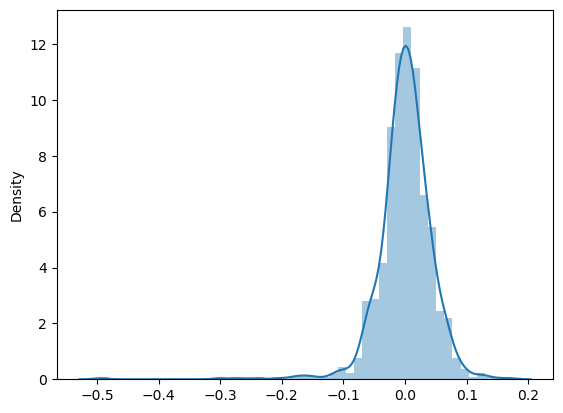

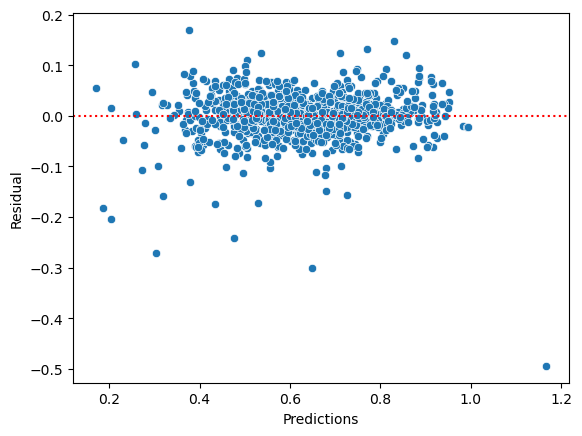

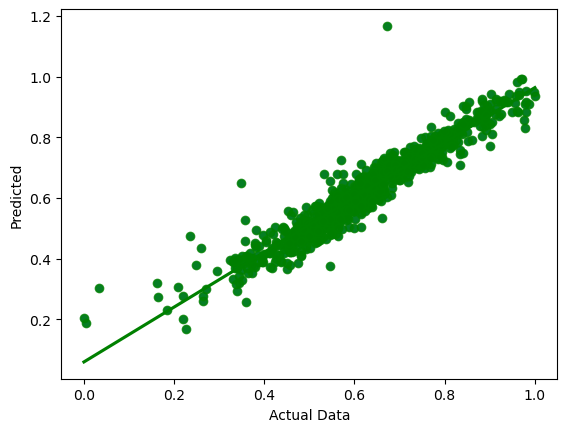

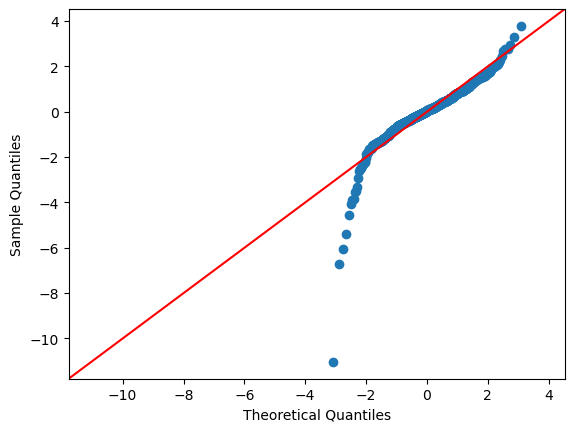

Residual analysis of test data
r2 score:  0.8911
rss : 1.1297
mse : 0.0027
rmse : 0.0515


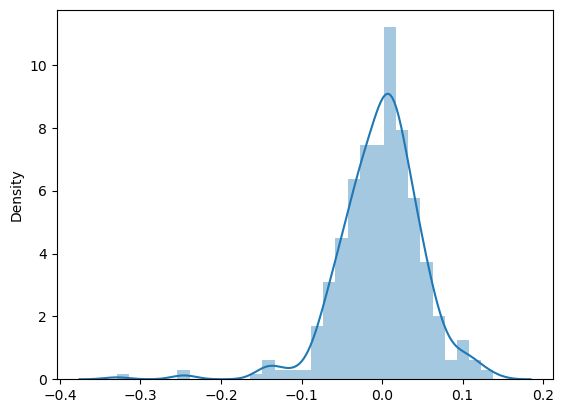

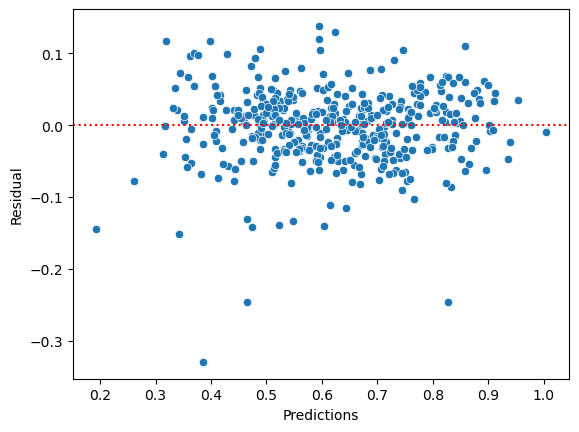

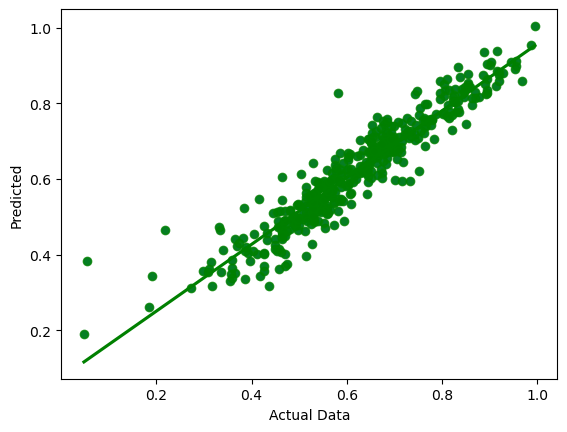

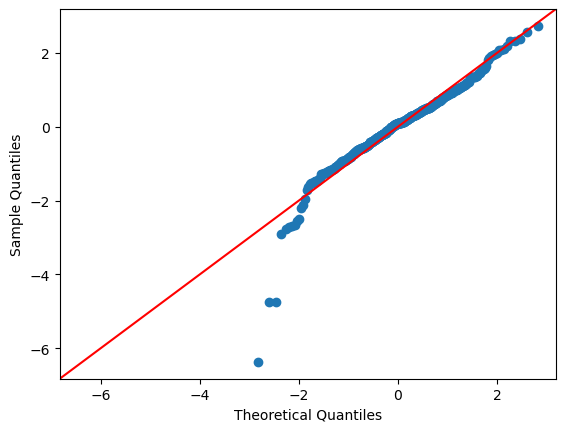

In [92]:
# Check the changes in the model if we choose to double the lambda value for Ridge 

# train test split
df_train, df_test = train_test_split(house_sales, train_size = 0.7, random_state = 100)

X_train = df_train.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_train = df_train['SalePrice'].values.reshape(-1)

X_test = df_test.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_test = df_test['SalePrice'].values.reshape(-1)
# Ridge model
alpha = 0.50
ridge_model = Ridge (alpha=alpha)
ridge_model.fit(X_train, y_train) 
print ("coef \n", ridge_model.coef_, '\n\n')

y_pred_train = ridge_model.predict(X_train)
print ("r2 score with training data set", round(r2_score(y_true = y_train, y_pred = y_pred_train), 4))


y_pred_test = ridge_model.predict(X_test)
print ("r2 score with test data set", round(r2_score(y_true = y_test, y_pred = y_pred_test), 4))

print('Residual analysis of training data')
residual = residual_analysis_of_data(y=y_train, y_pred=y_pred_train)
print('Residual analysis of test data')
residual = residual_analysis_of_data(y=y_test, y_pred=y_pred_test)

### The Ridge regression model built with doubling the Alpha from 0.25 to 0.50 has good accuracy  of about 91%. Residuals are normally distrubuted and the error terms have constant variance.

coef 
 [ 0.00000000e+00  2.37757232e-02 -0.00000000e+00 -0.00000000e+00
  0.00000000e+00 -2.87445216e-03  2.10588328e-01  1.38906118e-01
 -0.00000000e+00  2.87469456e-02  2.19637219e-02  1.95791096e-02
 -0.00000000e+00 -3.52601784e-02  1.45360091e-01  2.31546184e-02
  3.56822211e-01  3.83460753e-03  0.00000000e+00 -0.00000000e+00
  2.17750374e-03  3.43245636e-02  1.04380734e-03  9.19302068e-02
  2.20416211e-02  0.00000000e+00 -2.97912970e-03 -2.28119738e-03
 -3.53492132e-02 -1.35641175e-01 -3.49838049e-02  0.00000000e+00
 -0.00000000e+00  0.00000000e+00  0.00000000e+00  9.59316572e-03
  0.00000000e+00  0.00000000e+00 -0.00000000e+00  0.00000000e+00
 -2.04001339e-02 -4.88053994e-02 -0.00000000e+00  0.00000000e+00
  5.50382754e-02  1.16013821e-02  2.57315145e-02 -0.00000000e+00
  5.22352590e-03 -4.08641306e-03 -0.00000000e+00 -6.13536869e-03
 -0.00000000e+00 -0.00000000e+00  8.20965926e-03  1.61200646e-02
 -3.53021225e-03  4.91740461e-02 -1.71043415e-02 -2.59150710e-03
 -1.88146898e-02 -

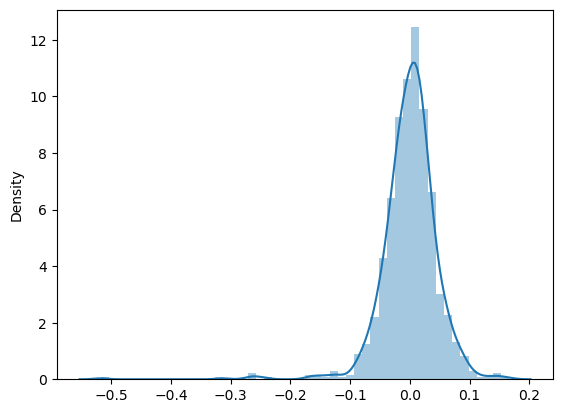

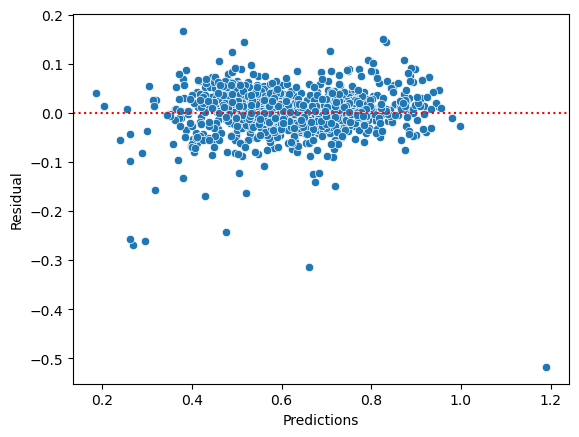

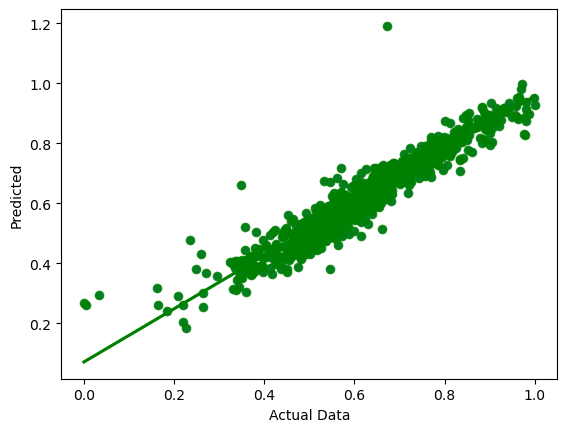

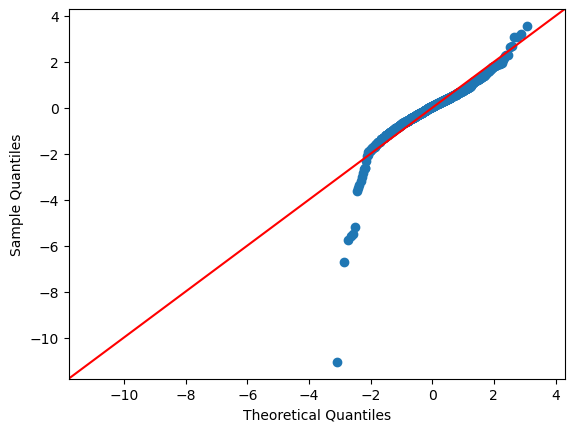

r2 score with test data set 0.8911
Residual Analysis of train data
r2 score:  0.8889
rss : 1.1525
mse : 0.0027
rmse : 0.052


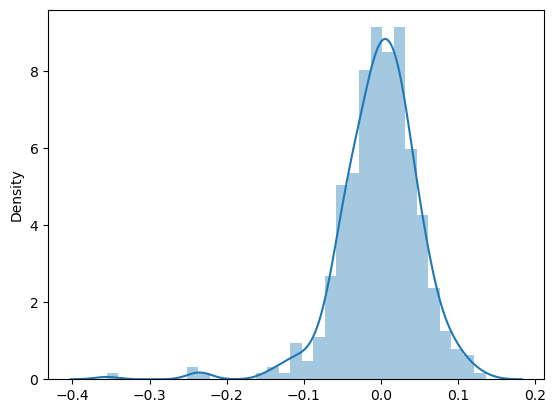

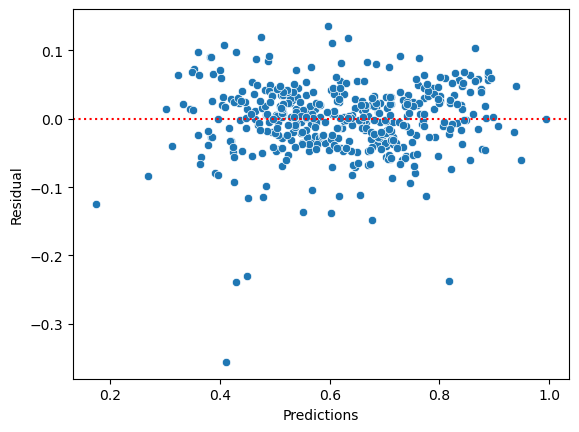

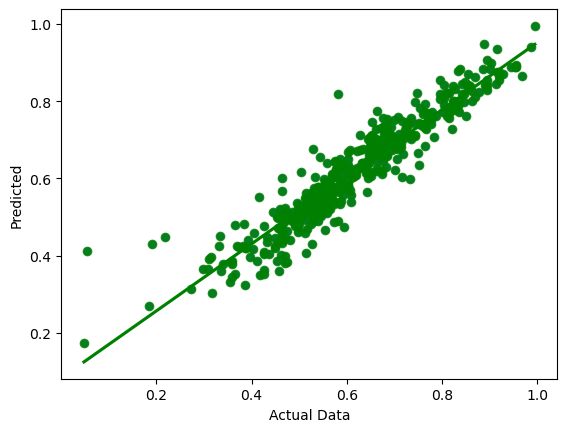

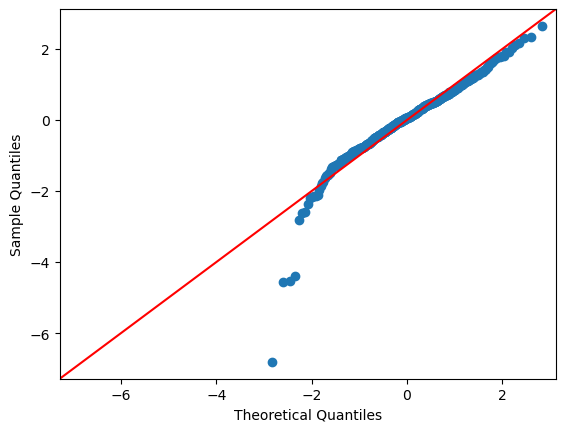

In [93]:
# Check the changes in the model if we choose to double the lambda value for Lasso regression

# train test split
df_train, df_test = train_test_split(house_sales, train_size = 0.7, random_state = 100)

X_train = df_train.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_train = df_train['SalePrice'].values.reshape(-1)

X_test = df_test.drop(columns = 'SalePrice').values.reshape(-1, len(df_train.drop(columns =  'SalePrice').columns))
y_test = df_test['SalePrice'].values.reshape(-1)
# Ridge model
alpha = 0.0002
lasso_model = Lasso(alpha = alpha)
lasso_model.fit(X_train, y_train) 
print ("coef \n", lasso_model.coef_, '\n\n')

y_pred_train = lasso_model.predict(X_train)
print ("r2 score with training data set", round(r2_score(y_true = y_train, y_pred = y_pred_train), 4))
print('Residual Analysis of train data')
residual = residual_analysis_of_data(y=y_train, y_pred=y_pred_train)


print ("r2 score with test data set", round(r2_score(y_true = y_test, y_pred = y_pred_test), 4))
print('Residual Analysis of train data')
y_pred_test = lasso_model.predict(X_test)
residual = residual_analysis_of_data(y=y_test, y_pred=y_pred_test)

### The Lasso regression model built with doubling the Alpha from 0.0001 to 0.0.002 has good accuracy  of about 91%. Residuals are normally distrubuted and the error terms have constant variance.

In [94]:
# Let's check the betas of Ridge and Lasso model
df_coef_after_doubling_alpha = pd.DataFrame(index= house_sales.drop(columns='SalePrice').columns)
df_coef_after_doubling_alpha['Lasso'] = lasso_model.coef_
df_coef_after_doubling_alpha


,Lasso
LotFrontage,0.000000
LotArea,0.023776
LotShape,-0.000000
LandContour,-0.000000
LandSlope,0.000000
HouseStyle,-0.002874
OverallQual,0.210588
OverallCond,0.138906
ExterCond,-0.000000
BsmtQual,0.028747


In [95]:
# Select top 1 feature from Lasso regression model after doubling alpha
df_coef_after_doubling_alpha['Absolute coef of Lasso'] = abs(df_coef_after_doubling_alpha.Lasso)
df_coef_after_doubling_alpha.sort_values(by = ['Absolute coef of Lasso'], ascending = False, inplace=True)
df_coef_after_doubling_alpha[:1]

,Lasso,Absolute coef of Lasso
GrLivArea,0.356822,0.356822


Model results with training data

Traing data analysis
r2 score:  0.8343
rss : 3.6994
mse : 0.0037
rmse : 0.0611


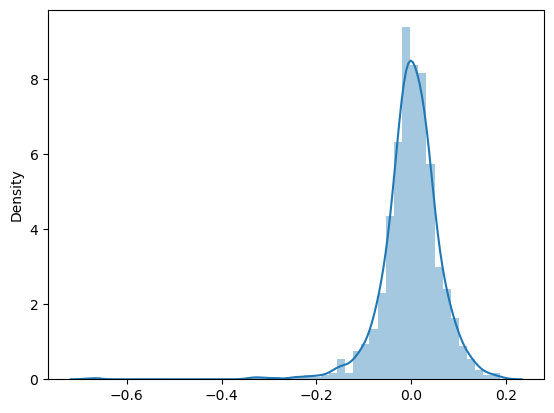

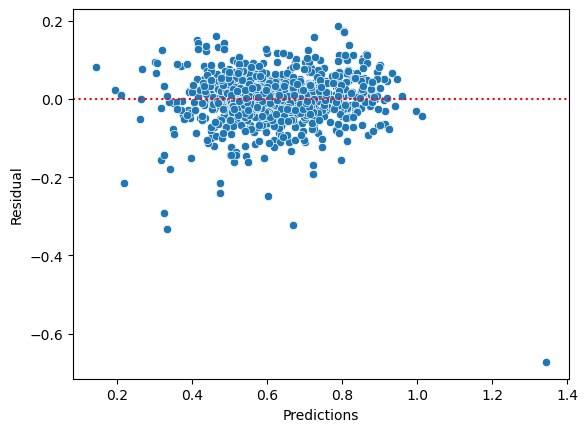

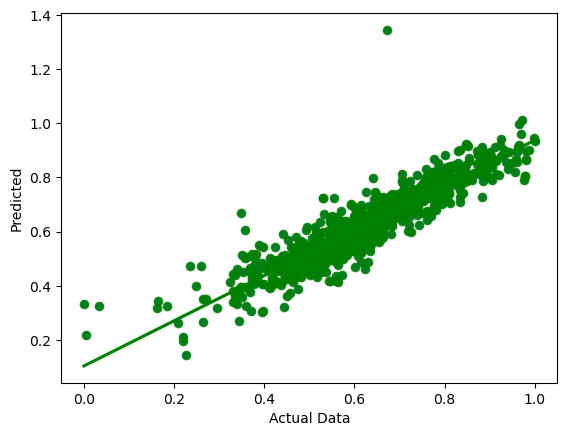

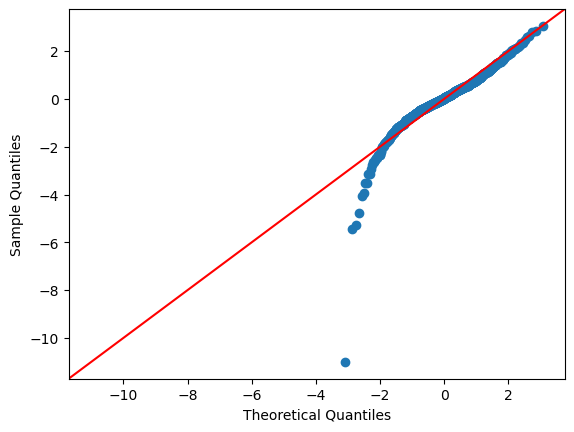

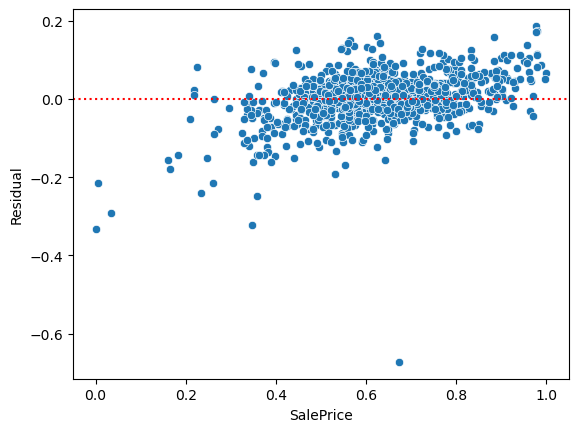

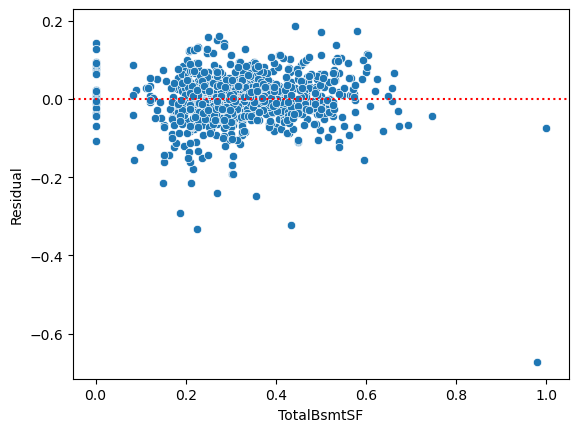

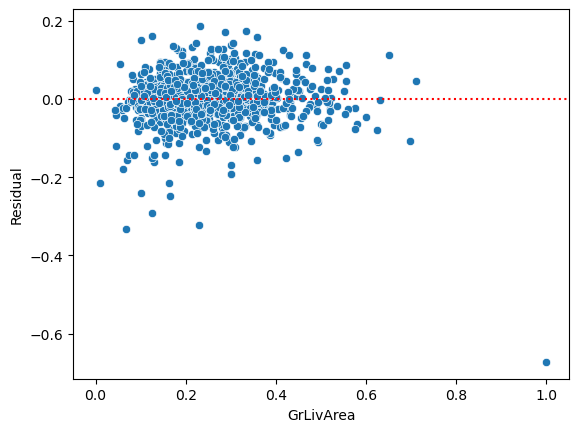

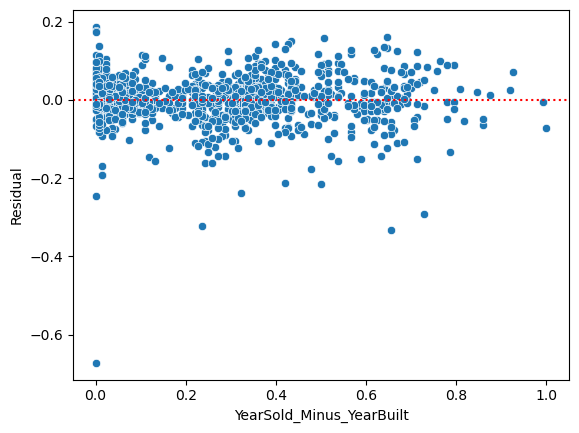




 Model results with test data
r2 score:  0.8442
rss : 1.6166
mse : 0.0038
rmse : 0.0616


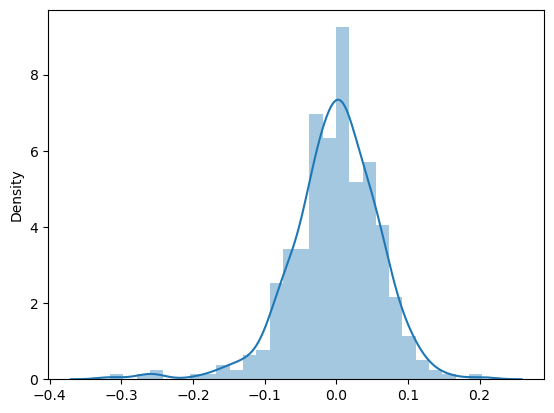

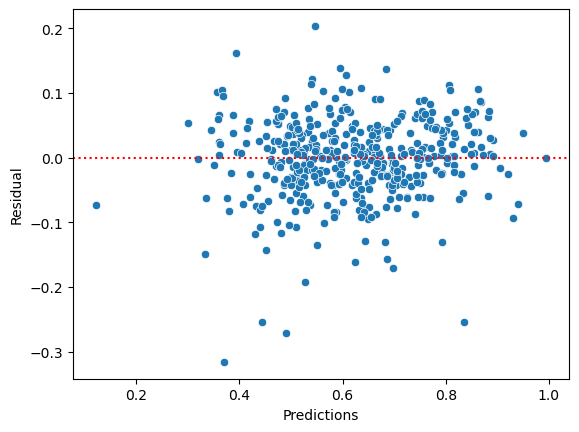

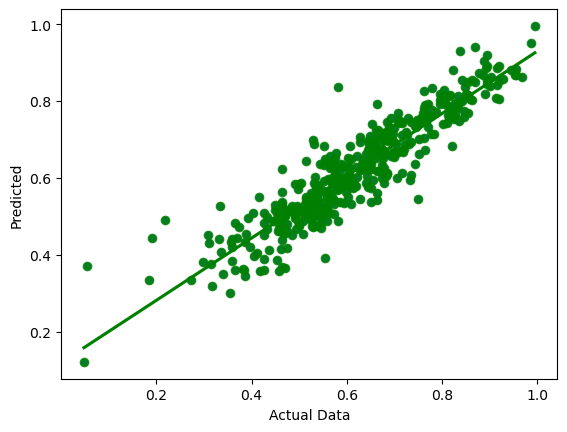

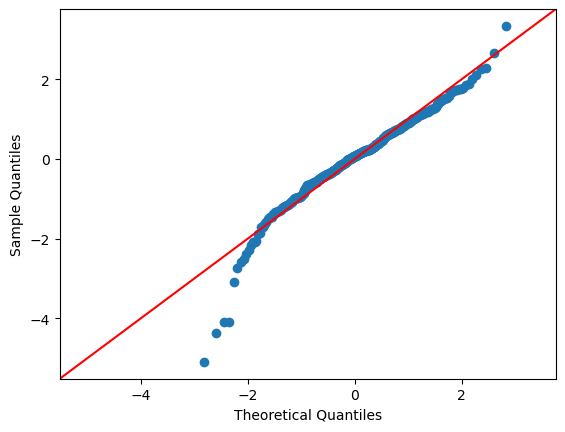

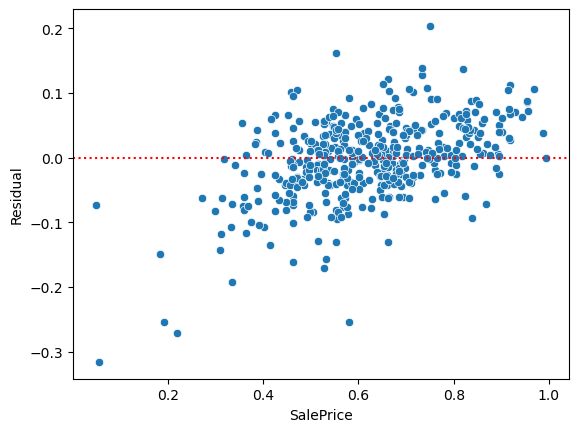

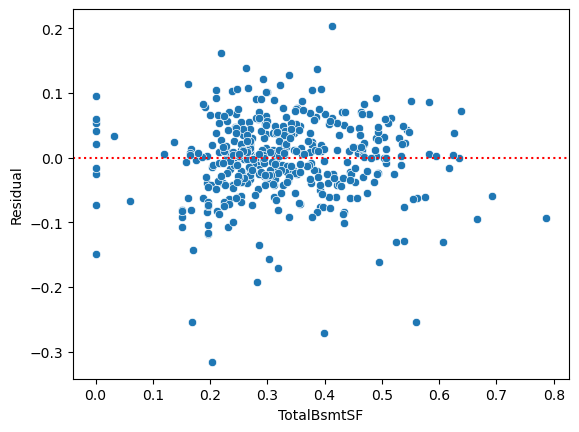

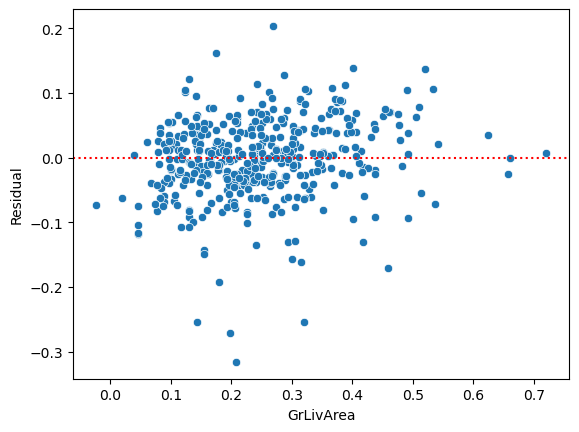

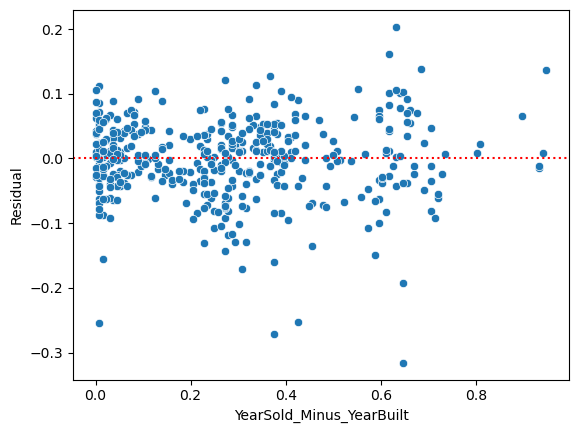

In [96]:
# The linear equation with with top 5 features will be 
train_test_split_and_build_linear_model(pDataFrame = house_sales[['GrLivArea','OverallQual','TotalBsmtSF','YearSold_Minus_YearBuilt','OverallCond','SalePrice']], pDependentFeature = 'SalePrice')

# <font color='Orange'> Interpretation </font>
1. Able to build a advanced linear regression model with the log data transformation of SalePrice
2. Able to build a Ridge regression model
3. Able to build a Lasso regression model
4. The optimal lambda/alpha for Ridge regression is 0.25
5. The optimal lambda/alpha for Lasso regression is 0.001
6. The top 5 features 'GrLivArea','OverallQual','TotalBsmtSF','YearSold_Minus_YearBuilt','OverallCond' will predict about 83% of changes in SalePrice and these could be used for making business decisions.
